Related work:
1. https://www.kaggle.com/soham27/exploratory-data-analysis-of-zomato-restaurant/notebook
2. https://www.kaggle.com/ngokulakannan/zomato-0-23-million-data-visualising-and-analysis
3. https://www.kaggle.com/sominwadhwa/where-what-to-eat-in-delhi-india-mapbox-w-plotly
4. https://www.kaggle.com/caicell/zomato-india-restaurants-eda
5. https://rstudio-pubs-static.s3.amazonaws.com/468664_fd94dd6a7ad14a07a8a232448494772c.html

In [4]:
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import plotly.express as px
import seaborn as sns

In [5]:
# Data source: https://www.kaggle.com/ngokulakannan/zomato-india-restaurants2-lakh-restaurants-data
df = pd.read_csv('indian_restaurants_details_cleaned_data.csv')
df.head(3)

,zomato_url,name,city,area,rating,rating_count,telephone,cusine,cost_for_two,address,timings,online_order,table_reservation,delivery_only,famous_food,longitude,latitude
0,https://www.zomato.com/ncr/sainik-food-pandav-...,Sainik Food,Delhi NCR,Pandav Nagar,3.2,21.0,011 22486474 +91 9717806814,North Indian,300.0,"C 4/1, Opposite Mother Dairy, Pandav Nagar, Ne...","{'Mon': [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0...",False,False,False,NaN,77.284871,28.617732
1,https://www.zomato.com/mumbai/kunals-creamery-...,Kunal's Creamery & Eatery,Mumbai,Ambernath,3.6,51.0,+91 9561356690 +91 9637537499,"Street Food, Chinese, Fast Food",500.0,"Shop 14, Trishul Shivdham Complex, Shiv Mandir...","{'Mon': [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 1...",False,False,False,Penne Pasta,73.184287,19.205887
2,https://www.zomato.com/ncr/brij-palace-restaur...,Brij Palace Restaurant,Delhi NCR,Jasola,NaN,NaN,+91 9891828106,North Indian,250.0,"4, Okhla Bus Stand, Jamia Nagar, Near, Jasola,...","{'Mon': [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1...",False,False,False,"Chana Masala , Butter Naan , Paneer Bhujia , D...",77.291223,28.563034


In [6]:
# remove unused columns
df.drop(labels=['zomato_url', 'telephone', 'address', 'online_order',
                'table_reservation', 'delivery_only'], inplace=True, axis=1)
df.dropna(inplace=True)
df.head()

,name,city,area,rating,rating_count,cusine,cost_for_two,timings,famous_food,longitude,latitude
1,Kunal's Creamery & Eatery,Mumbai,Ambernath,3.6,51.0,"Street Food, Chinese, Fast Food",500.0,"{'Mon': [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 1...",Penne Pasta,73.184287,19.205887
7,Applemint,Mumbai,Kharghar,3.5,94.0,Chinese,200.0,"{'Mon': [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1...","Momos , Liti Chokha , Chicken Momo , Litti , N...",73.065527,19.033390
9,Food Fantasy,Delhi NCR,Mayur Vihar Phase 1,3.8,437.0,"North Indian, Chinese, Fast Food",500.0,"{'Mon': [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1...","Tandoori Chicken , Pizza , Dal Makhani , Butte...",77.292763,28.608202
10,Curry And Combos Twist,Mumbai,Goregaon East,4.4,92.0,"North Indian, Chinese, Fast Food, Pizza, Panin...",550.0,"{'Mon': [0, 0, 0, 0, 0, 0, 0, 0, 0, 0.5, 1, 1,...","Kadhai Paneer , Paneer Tikka , Gulab Jamun , C...",72.869879,19.175588
15,Food Village,Kolkata,Baranagar,2.8,355.0,North Indian,650.0,"{'Mon': [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1...","Tandoori Chicken , Fish , Bbq Chicken , Veg Pu...",88.377416,22.652427


In [7]:
def filter_lat_long(df, sd=2):
  
  m_lo = df.longitude.mean()
  s_lo = df.longitude.std()
  m_la = df.latitude.mean()
  s_la = df.latitude.std()

  # keep only lat and long within 2 standard deviation (95%)
  df = df[(df.longitude > m_lo - sd * s_lo) & (df.longitude < m_lo + sd * s_lo)]
  df = df[(df.latitude > m_la - sd * s_la) & (df.latitude < m_la + sd * s_la)]

  return df

In [8]:
def get_city_restaurants(df, city='Delhi NCR', sd=2):
  city = df[df.city == city]
  city = filter_lat_long(city, sd)
  return city

In [9]:
df = filter_lat_long(df)
df.shape

(51091, 11)

In [10]:
df.city.unique()

array(['Mumbai', 'Delhi NCR', 'Kolkata', 'Bengaluru', 'Pune', 'Hyderabad',
       'Chennai', 'Lucknow', 'Ahmedabad', 'Jaipur', 'Chandigarh', 'Ooty',
       'Kochi', 'Indore', 'Shimla', 'Ludhiana', 'Gangtok', 'Kanpur',
       'Nashik', 'Visakhapatnam', 'Mangalore', 'Aurangabad', 'Coimbatore',
       'Dehradun', 'Amritsar', 'Nagpur', 'Rajkot', 'Surat', 'Vadodara',
       'Allahabad', 'Vijayawada', 'Jammu', 'Agra', 'Patna', 'Ranchi',
       'Ajmer', 'Neemrana', 'Cuttack', 'Gorakhpur', 'Madurai', 'Salem',
       'Bhopal', 'Manali', 'Mysore', 'Mussoorie', 'Trichy', 'Rishikesh',
       'Dharamshala', 'Jalandhar', 'Raipur', 'Udaipur', 'Patiala',
       'Haridwar', 'Puducherry', 'Varanasi', 'Pushkar', 'Goa',
       'Bhubaneswar', 'Kota', 'Siliguri', 'Meerut', 'Jabalpur', 'Manipal',
       'Gwalior', 'Vellore', 'Guntur', 'Jodhpur', 'Thrissur', 'Nainital',
       'Jamshedpur', 'Jhansi', 'Darjeeling'], dtype=object)

# Maps

In [11]:
token = '### api-token ###'
px.set_mapbox_access_token(token)

In [12]:
delhi = df[df.city == 'Delhi NCR']

In [13]:
delhi = filter_lat_long(delhi)

In [14]:
delhi.describe()

,rating,rating_count,cost_for_two,longitude,latitude
count,10874.000000,10874.000000,10874.000000,10874.000000,10874.000000
mean,3.777405,324.633254,672.450616,77.192627,28.577068
std,0.380904,558.488792,605.794935,0.103761,0.080266
min,1.800000,4.000000,50.000000,76.980779,28.403493
25%,3.600000,75.000000,350.000000,77.097332,28.525841
50%,3.800000,153.000000,500.000000,77.193825,28.573724
75%,4.000000,345.000000,700.000000,77.268342,28.640872
max,4.900000,10035.000000,8000.000000,77.430198,28.743949


In [15]:
def map_plot(df, title="Restaurant Locations"):
  fig = px.scatter_mapbox(df, lat='latitude', lon='longitude', hover_name='name', 
                        hover_data=['city', 'rating', 'cusine', 'cost_for_two'],
                        color_discrete_sequence=['blue'], zoom=10, opacity=0.5,
                         height=500, width=700, mapbox_style='outdoors', #mapbox_style='open-street-map',
                        title=title)

  fig.update_layout(margin={'r':0, 't':50, 'l':0, 'b':0})

  fig.show()

In [16]:
map_plot(delhi)

In [19]:
delhi_italian = delhi[delhi.cusine.str.contains('Italian')]
top_100_italian = delhi_italian.sort_values(by='rating', ascending=False)[:100]

In [20]:
fig = px.scatter_mapbox(top_100_italian, lat="latitude", lon="longitude", hover_name="name", 
                        hover_data=["rating", "cusine", "cost_for_two", "rating_count"],
                        color='rating', size='cost_for_two', zoom=10, opacity=0.5,
                        size_max=20,
                        color_continuous_scale=px.colors.sequential.Viridis,
                        mapbox_style='outdoors', height=500, width=700, 
                        title='Italian Restaurant Locations')

fig.update_layout(margin={"r":0, "t":50, "l":0, "b":0})
fig.show()

# Which is the best neighborhood in my city?

In [21]:
bangalore = get_city_restaurants(df, 'Bengaluru')

In [22]:
# merge different blocks of Koramangala into one
def change(x):
  if x.startswith('Koramangala'):
    return x.split(' ')[0]
  return x

In [23]:
bangalore.area = bangalore.area.map(change)

In [24]:
top_100_restaurants = bangalore.sort_values(by='rating', ascending=False)[:100]

In [25]:
bangalore_nc = bangalore.dropna(subset=['cusine'])
bangalore_italian = bangalore_nc[bangalore_nc.cusine.str.contains('Italian')]
top_100_italian = bangalore_italian.sort_values(by='rating', ascending=False)[:100]

In [26]:
from sklearn.cluster import KMeans

In [27]:
def get_clusters(df, n_clusters=12, top_n_clusters=5):
  x = df[['longitude', 'latitude']].values
  kmeans = KMeans(init="k-means++", n_clusters=n_clusters)
  kmeans.fit(x)

  hits = []
  for i, j in kmeans.cluster_centers_:
    k = (x[:, 0] > i - kmeans.inertia_) & (x[:, 0] < i + kmeans.inertia_) & (x[:, 1] > j - kmeans.inertia_) & (x[:, 1] < j + kmeans.inertia_)
    hits.append(sum(k))
  top_clusters = np.argsort(-np.array(hits))[:top_n_clusters]

  return top_clusters, kmeans

In [28]:
top_clusters, kmeans = get_clusters(top_100_restaurants, top_n_clusters=3)
r = kmeans.inertia_

In [29]:
fig = px.scatter_mapbox(top_100_restaurants, lat='latitude', lon='longitude', hover_name='name', 
                        hover_data=['city', 'rating', 'cusine', 'cost_for_two'],
                        color_discrete_sequence=['blue'], zoom=11, opacity=0.5,
                         height=500, width=700, mapbox_style='outdoors',
                        title='Top 100 restaurants in bangalore')

for i, j in kmeans.cluster_centers_[top_clusters]:
  dot = pd.DataFrame({'x': [i], 'y': [j], 'size': 1})
  marker = (px.scatter_mapbox(dot, lat='y', lon='x', size='size', size_max=int(r*3000),
                        color_discrete_sequence=['black'], zoom=11, opacity=0.2))
  fig.add_trace(marker.data[0])

fig.update_layout(margin={'r':0, 't':50, 'l':0, 'b':0})

fig.show()

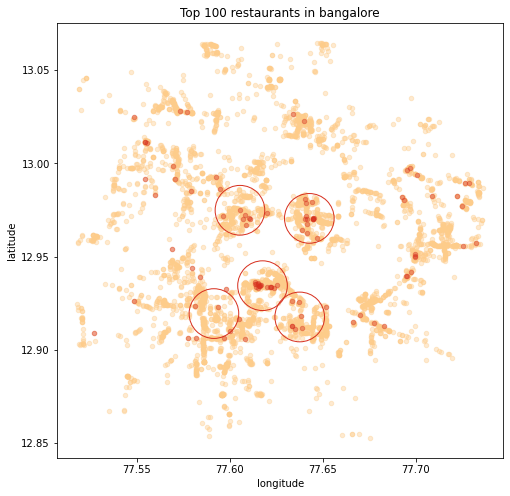

In [30]:
top_clusters, kmeans = get_clusters(top_100_restaurants)

fig, ax = plt.subplots(figsize=(8, 8))
bangalore.plot(kind="scatter", x="longitude", y="latitude", alpha=0.4, color='#fdcc8a', ax=ax)
top_100_restaurants.plot(kind="scatter", x="longitude", y="latitude", alpha=0.4, color='#d7301f', ax=ax)
for i, j in kmeans.cluster_centers_[top_clusters]:
  circ = plt.Circle((i, j), kmeans.inertia_, edgecolor='#d7301f', fill=False)
  ax.add_patch(circ)
ax.set_aspect('equal', adjustable='datalim')
ax.set_title('Top 100 restaurants in bangalore');

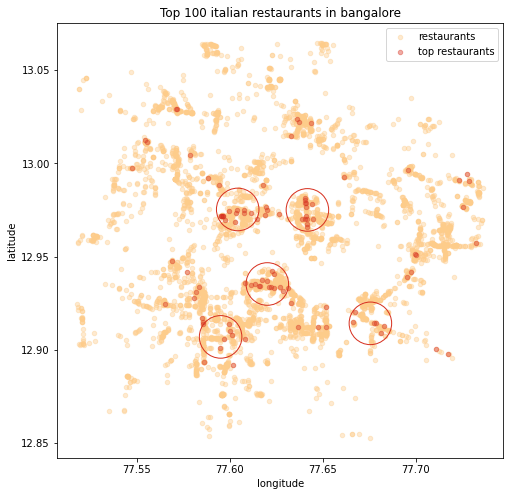

In [31]:
top_clusters, kmeans = get_clusters(top_100_italian)

fig, ax = plt.subplots(figsize=(8, 8))
bangalore.plot(kind="scatter", x="longitude", y="latitude", alpha=0.4, color='#fdcc8a', ax=ax, label='restaurants')
top_100_italian.plot(kind="scatter", x="longitude", y="latitude", alpha=0.4, color='#d7301f', ax=ax, label='top restaurants')
for i, j in kmeans.cluster_centers_[top_clusters]:
  circ = plt.Circle((i, j), kmeans.inertia_, edgecolor='#d7301f', fill=False)
  ax.add_patch(circ)
ax.set_aspect('equal', adjustable='datalim')
ax.set_title('Top 100 italian restaurants in bangalore');

In [32]:
top_100_restaurants.area.value_counts()

Koramangala                      20
Indiranagar                      14
Whitefield                        9
Marathahalli                      8
HSR                               6
Malleshwaram                      5
Jayanagar                         4
Sarjapur Road                     4
BTM                               3
Brigade Road                      3
JP Nagar                          3
New BEL Road                      2
Kalyan Nagar                      2
Basavanagudi                      2
Rajajinagar                       2
Lavelle Road                      1
Varthur Main Road, Whitefield     1
Rajarajeshwari Nagar              1
MG Road                           1
Cunningham Road                   1
Church Street                     1
Vasanth Nagar                     1
Yeshwantpur                       1
Race Course Road                  1
Old Airport Road                  1
Banashankari                      1
Residency Road                    1
Richmond Road               

In [33]:
# split cuisine
df_list = list(np.array(top_100_restaurants))
df_1_list = []
for i in range(0,len(df_list)):
    string2 = df_list[i][5]
    try:
        string3 = string2.split(',')
    except:
        pass
    for j in range(len(string3)):
        weight = 1/len(string3) # since restaurant gets duplicated, give it less weight
        df_1_list.append(list(df_list[i])+[string3[j].strip()]+[weight])
    string3=[]

In [36]:
df_7 = pd.DataFrame(df_1_list, columns = ['name', 'city', 'area', 'rating', 'rating_count', 'cusine_old', 'cost_for_two',
       'time', 'popular food', 'longitude', 'latitude', 'cuisine', 'weight'])
df_7.drop(['cusine_old', 'time', 'popular food'], inplace=True, axis=1)

In [37]:
df_7.head(5)

,name,city,area,rating,rating_count,cost_for_two,longitude,latitude,cuisine,weight
0,AB's - Absolute Barbecues,Bengaluru,BTM,4.9,7363.0,1600.0,77.604780,12.916358,European,0.250000
1,AB's - Absolute Barbecues,Bengaluru,BTM,4.9,7363.0,1600.0,77.604780,12.916358,Mediterranean,0.250000
2,AB's - Absolute Barbecues,Bengaluru,BTM,4.9,7363.0,1600.0,77.604780,12.916358,North Indian,0.250000
3,AB's - Absolute Barbecues,Bengaluru,BTM,4.9,7363.0,1600.0,77.604780,12.916358,BBQ,0.250000
4,Byg Brewski Brewing Company,Bengaluru,Sarjapur Road,4.9,19305.0,1600.0,77.682906,12.912934,Continental,0.166667


In [38]:
df_7.weight.mean()

0.33112582781456956

In [39]:
df_7.weight = df_7.weight.map(lambda x: 0.3*2*x if x>=0.5 else x) # just a heuristic

In [40]:
df_7[(df_7.area == 'Koramangala') & (df_7.cuisine == 'Desserts')]

,name,city,area,rating,rating_count,cost_for_two,longitude,latitude,cuisine,weight
73,ECHOES Koramangala,Bengaluru,Koramangala,4.7,3529.0,950.0,77.615752,12.934126,Desserts,0.25
98,Lot Like Crepes,Bengaluru,Koramangala,4.7,1051.0,550.0,77.613468,12.936585,Desserts,0.30
105,Corner House Ice Cream,Bengaluru,Koramangala,4.7,380.0,350.0,77.619799,12.933721,Desserts,0.30
166,XO Belgian Waffle,Bengaluru,Koramangala,4.6,920.0,500.0,77.616048,12.934448,Desserts,0.30
237,Belgian Waffle Factory,Bengaluru,Koramangala,4.6,322.0,500.0,77.616924,12.934560,Desserts,0.60
242,The Pancake Story,Bengaluru,Koramangala,4.6,175.0,450.0,77.633492,12.925924,Desserts,0.30


In [41]:
k = df_7.groupby(['area', 'cuisine']).size().reset_index(name='counts')
k['cost_for_two'] = df_7.groupby(['area', 'cuisine']).cost_for_two.mean().reset_index(name='mean')['mean']
k.head()

,area,cuisine,counts,cost_for_two
0,BTM,Asian,1,1300.0
1,BTM,BBQ,1,1600.0
2,BTM,Bar Food,1,2000.0
3,BTM,Chinese,1,2000.0
4,BTM,Continental,2,1650.0


In [42]:
fig = px.treemap(k, path=[px.Constant('Bengalore'), 'area', 'cuisine'], values='counts', color_continuous_scale='RdBu', 
                 color='cost_for_two', title='Distribution of top rated restaurants')
fig.update_layout(margin = dict(t=50, l=25, r=25, b=25))
fig.show()

# Best localities if I want to keep my bill low

In [43]:
cost_less_than = 500
cheap_100_restaurants = bangalore[bangalore['cost_for_two'] < cost_less_than].sort_values(by=['rating'], ascending=False)[:100]

In [45]:
cheap_100_restaurants.head()

,name,city,area,rating,rating_count,cusine,cost_for_two,timings,famous_food,longitude,latitude
65428,Milano Ice Cream,Bengaluru,Indiranagar,4.9,2370.0,"Ice Cream, Desserts",400.0,"{'Mon': [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1...","Truffle , Tiramisu , Apple Pie , Carrot Cake ,...",77.644039,12.979121
64788,Taaza Thindi,Bengaluru,Jayanagar,4.9,4376.0,South Indian,100.0,"{'Mon': [0, 0, 0, 0, 0, 0, 0, 1, 1, 1, 1, 1, 0...","Masala Dosa , Idli , Vada , Kesari Bath , Filt...",77.593459,12.922829
70248,Brahmin's Coffee Bar,Bengaluru,Basavanagudi,4.8,2812.0,South Indian,100.0,"{'Mon': [0, 0, 0, 0, 0, 0, 1, 1, 1, 1, 1, 1, 0...","Filtered Coffee , Kesari Bath , Idli Vada , Up...",77.568948,12.954032
67730,Arogya Ahaara,Bengaluru,HSR,4.7,570.0,South Indian,100.0,"{'Mon': [0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 1, 1, 1...","Coffee , Idli , Masala Dosa , Vada , Kesari Ba...",77.638023,12.918325
71009,O.G. Variar & Sons,Bengaluru,Rajajinagar,4.7,1256.0,"Bakery, Desserts",200.0,"{'Mon': [0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 1, 1...","Veg Puff , Plum Cake , Sponge Cake , Coconut B...",77.554538,12.991436


In [46]:
top_clusters, kmeans = get_clusters(cheap_100_restaurants, n_clusters=14, top_n_clusters=3)
r = kmeans.inertia_

In [47]:
fig = px.scatter_mapbox(cheap_100_restaurants, lat='latitude', lon='longitude', hover_name='name', 
                        hover_data=['city', 'rating', 'cusine', 'cost_for_two'],
                        color_discrete_sequence=['blue'], zoom=11, opacity=0.5,
                         height=500, width=700, mapbox_style='outdoors',
                        title='Top 100 restaurants with cost < $7 in bangalore')

for i, j in kmeans.cluster_centers_[top_clusters]:
  dot = pd.DataFrame({'x': [i], 'y': [j], 'size': 1})
  marker = (px.scatter_mapbox(dot, lat='y', lon='x', size='size', size_max=int(r*3000),
                        color_discrete_sequence=['black'], zoom=11, opacity=0.2))
  fig.add_trace(marker.data[0])

fig.update_layout(margin={'r':0, 't':50, 'l':0, 'b':0})

fig.show()

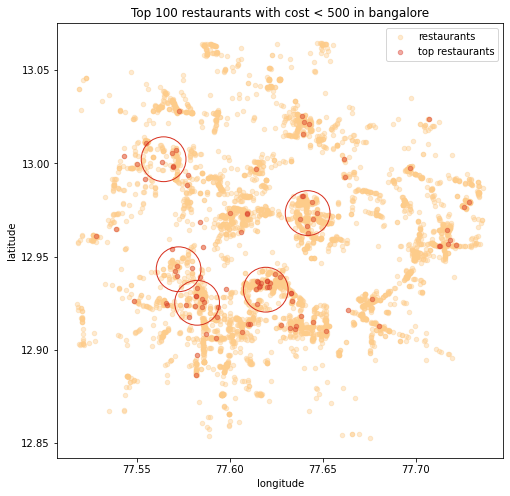

In [48]:
top_clusters, kmeans = get_clusters(cheap_100_restaurants, n_clusters=14)

fig, ax = plt.subplots(figsize=(8, 8))
bangalore.plot(kind="scatter", x="longitude", y="latitude", alpha=0.4, color='#fdcc8a', ax=ax, label='restaurants')
cheap_100_restaurants.plot(kind="scatter", x="longitude", y="latitude", alpha=0.4, color='#d7301f', ax=ax, label='top restaurants')
for i, j in kmeans.cluster_centers_[top_clusters]:
  circ = plt.Circle((i, j), kmeans.inertia_, edgecolor='#d7301f', fill=False)
  ax.add_patch(circ)
ax.set_aspect('equal', adjustable='datalim')
ax.set_title('Top 100 restaurants with cost < 500 in bangalore');

# Popular cuisine in my neighbourhood

In [49]:
neighbourhood = (77.72, 12.98, 0.025)

In [50]:
my_nh_restaurants =  bangalore[(bangalore['longitude'] < neighbourhood[0]+neighbourhood[2]) & 
                               (bangalore['longitude'] > neighbourhood[0]-neighbourhood[2]) & 
                               (bangalore['latitude'] < neighbourhood[1]+neighbourhood[2]) & 
                               (bangalore['latitude'] > neighbourhood[1]-neighbourhood[2])]

In [51]:
my_nh_restaurants.shape

(456, 11)

In [52]:
top_my_nh_res = my_nh_restaurants.sort_values(by=['rating'], ascending=False)[:100]

In [53]:
top_my_nh_res.head()

,name,city,area,rating,rating_count,cusine,cost_for_two,timings,famous_food,longitude,latitude
188266,Mainland China,Bengaluru,Whitefield,4.8,2229.0,"Chinese, Asian, Sushi, Japanese, Thai",1700.0,"{'Mon': [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1...","Noodle , Dumplings , Fish , Tai Pai Chicken , ...",77.725158,12.955788
62600,Biergarten,Bengaluru,Whitefield,4.7,8263.0,"Continental, European, BBQ, Chinese, Asian",2400.0,"{'Mon': [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1...","Wheat Beer , Pizza , Nachos , Cocktails , Riso...",77.708533,12.982446
63621,Windmills Craftworks,Bengaluru,Whitefield,4.7,6289.0,"American, North Indian, Salad",2500.0,"{'Mon': [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1...","Beer , Cocktails , Hefeweizen , Keema Pav , Na...",77.721979,12.982413
184567,AB's - Absolute Barbecues,Bengaluru,Whitefield,4.7,4215.0,"European, Mediterranean, North Indian, BBQ",1600.0,"{'Mon': [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1...","Paan Ice Cream , Fish , Sea Food , Prawn , Cri...",77.724956,12.976904
187366,Polar Bear,Bengaluru,"Varthur Main Road, Whitefield",4.6,114.0,"Desserts, Ice Cream, Bakery, Fast Food",300.0,"{'Mon': [1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1...","Brownie , Hot Chocolate Fudge , Death By Choco...",77.721558,12.956148


In [54]:
popular_cuisine = {}
for cuisines in top_my_nh_res.cusine.unique():
  cuisines_list = cuisines.replace(' ', '').lower().split(',')
  for cuisine in cuisines_list:
    count = popular_cuisine.get(cuisine, 0)
    popular_cuisine[cuisine] = count + 1
print(popular_cuisine)

{'chinese': 18, 'asian': 12, 'sushi': 2, 'japanese': 2, 'thai': 3, 'continental': 17, 'european': 5, 'bbq': 6, 'american': 8, 'northindian': 28, 'salad': 7, 'mediterranean': 6, 'desserts': 14, 'icecream': 4, 'bakery': 6, 'fastfood': 13, 'southindian': 5, 'modernindian': 2, 'italian': 13, 'biryani': 5, 'beverages': 14, 'fingerfood': 7, 'momos': 3, 'cafe': 10, 'indonesian': 1, 'pizza': 6, 'african': 1, 'burger': 4, 'rolls': 1, 'healthyfood': 3, 'rajasthani': 1, 'vietnamese': 1, 'korean': 1, 'sandwich': 2, 'wraps': 1, 'lebanese': 2, 'paan': 1, 'kerala': 1, 'arabian': 2, 'mughlai': 3, 'seafood': 1, 'mithai': 1, 'streetfood': 4, 'mexican': 1, 'french': 1, 'tea': 2}


In [55]:
top_5_cuisine = [k for k, _ in sorted(popular_cuisine.items(), key=lambda item: -item[1])][:5]
top_5_cuisine

['northindian', 'chinese', 'continental', 'desserts', 'beverages']

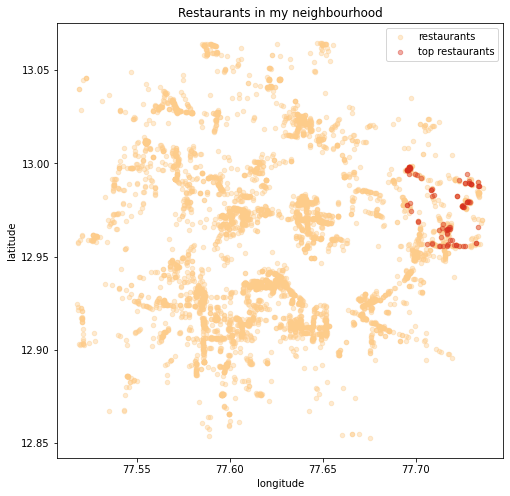

In [56]:
fig, ax = plt.subplots(figsize=(8, 8))

bangalore.plot(kind="scatter", x="longitude", y="latitude", alpha=0.4, color='#fdcc8a', ax=ax, label='restaurants')
top_my_nh_res.plot(kind="scatter", x="longitude", y="latitude", alpha=0.4, color='#d7301f', ax=ax, label='top restaurants')

ax.set_aspect('equal', adjustable='datalim')
ax.set_title('Restaurants in my neighbourhood');

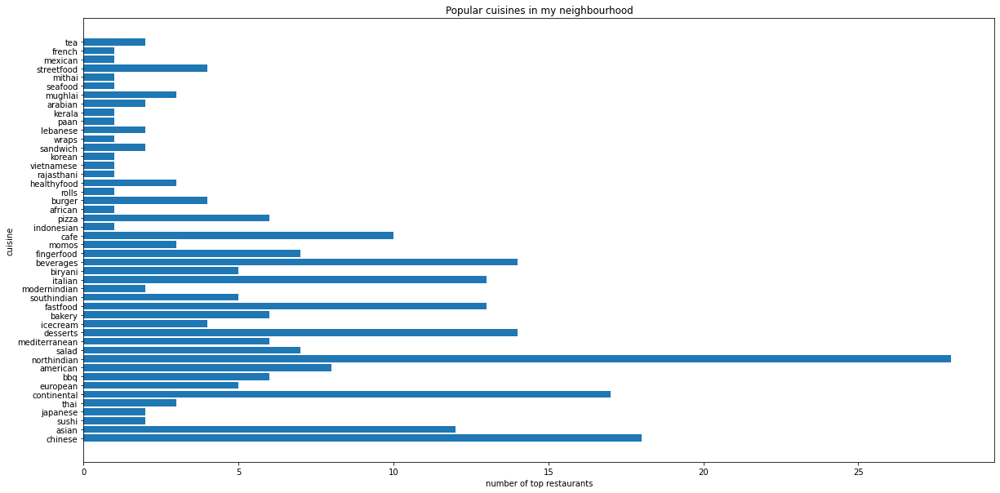

In [57]:
plt.figure(figsize=(20, 10))
plt.barh(list(popular_cuisine.keys()), list(popular_cuisine.values()))
plt.xlabel('number of top restaurants')
plt.ylabel('cuisine')
plt.title('Popular cuisines in my neighbourhood');

# Is paying more for food really worth?

In [58]:
df_nr = df.dropna(subset=['rating'])
most_expensive = df_nr.sort_values(by=['cost_for_two'], ascending=False)[:500]
least_expensive = df_nr.sort_values(by=['cost_for_two'], ascending=True)[:500]

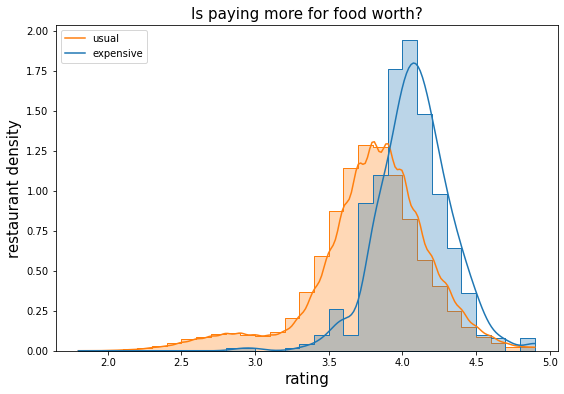

In [59]:
plt.figure(figsize=(9, 6))
sns.histplot([most_expensive.rating.values, df_nr.rating.values], alpha=0.3,
             stat='density', kde=True, element='step', common_norm=False, binwidth=0.1)
# sns.histplot(, alpha=0.3, stat='density', kde=True)
plt.xlabel('rating', size=15)
plt.ylabel('restaurant density', size=15)
plt.legend(['usual', 'expensive'], loc='upper left')
plt.title('Is paying more for food worth?', size=15);

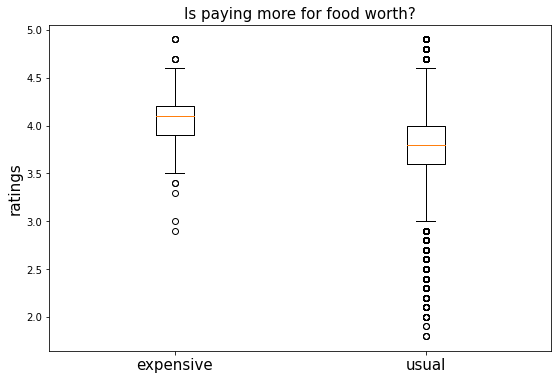

In [60]:
plt.figure(figsize=(9, 6))
plt.boxplot([most_expensive.rating.values, df_nr.rating.values]);
plt.ylabel('ratings', size=15)
plt.xticks([1, 2], ['expensive', 'usual'], size=15)
plt.title('Is paying more for food worth?', size=15);

# How does the average ratings of different cities compare

In [61]:
import seaborn as sns

In [62]:
df['city'].unique()

array(['Mumbai', 'Delhi NCR', 'Kolkata', 'Bengaluru', 'Pune', 'Hyderabad',
       'Chennai', 'Lucknow', 'Ahmedabad', 'Jaipur', 'Chandigarh', 'Ooty',
       'Kochi', 'Indore', 'Shimla', 'Ludhiana', 'Gangtok', 'Kanpur',
       'Nashik', 'Visakhapatnam', 'Mangalore', 'Aurangabad', 'Coimbatore',
       'Dehradun', 'Amritsar', 'Nagpur', 'Rajkot', 'Surat', 'Vadodara',
       'Allahabad', 'Vijayawada', 'Jammu', 'Agra', 'Patna', 'Ranchi',
       'Ajmer', 'Neemrana', 'Cuttack', 'Gorakhpur', 'Madurai', 'Salem',
       'Bhopal', 'Manali', 'Mysore', 'Mussoorie', 'Trichy', 'Rishikesh',
       'Dharamshala', 'Jalandhar', 'Raipur', 'Udaipur', 'Patiala',
       'Haridwar', 'Puducherry', 'Varanasi', 'Pushkar', 'Goa',
       'Bhubaneswar', 'Kota', 'Siliguri', 'Meerut', 'Jabalpur', 'Manipal',
       'Gwalior', 'Vellore', 'Guntur', 'Jodhpur', 'Thrissur', 'Nainital',
       'Jamshedpur', 'Jhansi', 'Darjeeling'], dtype=object)

In [63]:
major_cities = df[(df.city=='Delhi NCR') |
                  (df.city=='Mumbai') |
                  (df.city=='Bengaluru') |
                  (df.city=='Kolkata')]
major_cities = major_cities[major_cities.cusine.str.contains('North Indian')].sample(1000)

In [64]:
major_cities.head()

,name,city,area,rating,rating_count,cusine,cost_for_two,timings,famous_food,longitude,latitude
38118,The Turnover By Santa Delivers,Kolkata,"Sector 5, Salt Lake",4.2,51.0,North Indian,350.0,"{'Mon': [1, 1, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 1...","Butter Chicken , Cheesy Chicken Kebab , Shredd...",88.435204,22.584398
44211,Honest,Mumbai,Borivali West,3.6,168.0,"North Indian, South Indian, Fast Food",550.0,"{'Mon': [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0.5,...","Pav Bhaji , Pasta , Tawa Pulav , Panipuri , Pi...",72.852172,19.227350
180831,FreshMenu,Mumbai,Andheri East,3.7,202.0,"Continental, Healthy Food, Chinese, North Indi...",450.0,"{'Mon': [0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 1, 1, 1...","Noodle , Chicken Steak , Spinach Corn Sandwich...",72.859926,19.119136
33527,Dakshin,Mumbai,Borivali West,3.6,453.0,"Chinese, North Indian, Malwani, Seafood",900.0,"{'Mon': [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1...","Sea Food , Sol Kadhi , Malwani Food , Roti , C...",72.842721,19.229620
7287,Pt.Kanhaiyalal & Durga Prasad Dixit Paranthe Wale,Delhi NCR,Chandni Chowk,3.9,417.0,North Indian,150.0,"{'Mon': [0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 1, 1...","Papad Paratha , Sweet Lassi , Aloo Paratha , S...",77.230427,28.656073


<AxesSubplot:xlabel='city', ylabel='rating'>

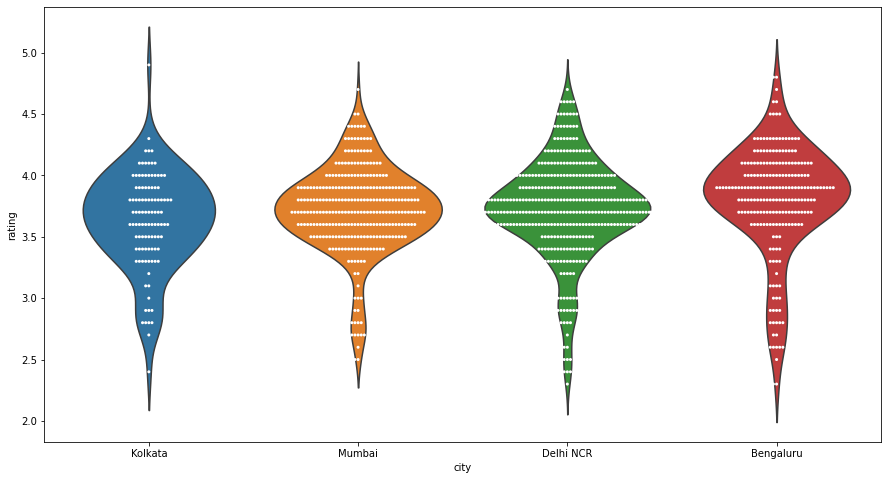

In [65]:
plt.figure(figsize=(15, 8))
sns.violinplot(x="city", y="rating", data=major_cities, inner=None)
sns.swarmplot(x="city", y="rating", data=major_cities, color="white", edgecolor="gray", size=3)

# Cost of food across cities

In [66]:
def filter_cost(df):
  
  m = df.cost_for_two.mean()
  s = df.cost_for_two.std()

  # keep only within 2 standard deviation (95%)
  # df = df[(df.cost_for_two > m - 5 * s) & (df.cost_for_two < m + 5 * s)]
  df = df[df.cost_for_two <= 1500]

  return df

In [67]:
delhi = filter_cost(get_city_restaurants(df, 'Delhi NCR'))
bengaore = filter_cost(get_city_restaurants(df, 'Bengaluru'))
kolkata = filter_cost(get_city_restaurants(df, 'Kolkata'))
mumbai = filter_cost(get_city_restaurants(df, 'Mumbai'))

In [68]:
def get_bins(df):
  costs = df.cost_for_two.values
  num = np.histogram(costs, bins=np.arange(0, 1501, 100))[0] / len(costs)
  return np.insert(num, 0, 0)

In [69]:
delhi_bins = get_bins(delhi)
bengaore_bins = get_bins(bengaore)
kolkata_bins = get_bins(kolkata)
mumbai_bins = get_bins(mumbai)

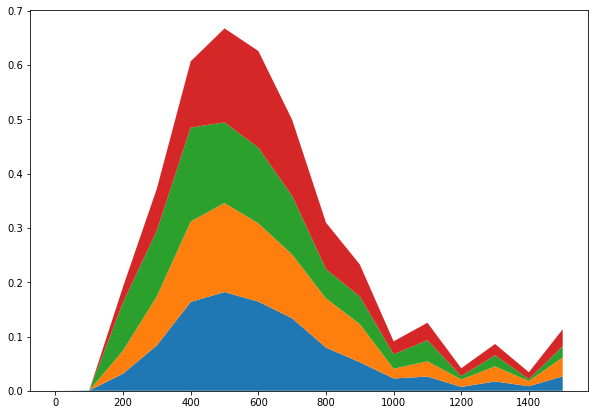

In [70]:
fig, ax = plt.subplots(figsize=(10, 7))
x = np.arange(0, 1501, 100)
y = [delhi_bins, bengaore_bins, kolkata_bins, mumbai_bins]
ax.stackplot(x, y);

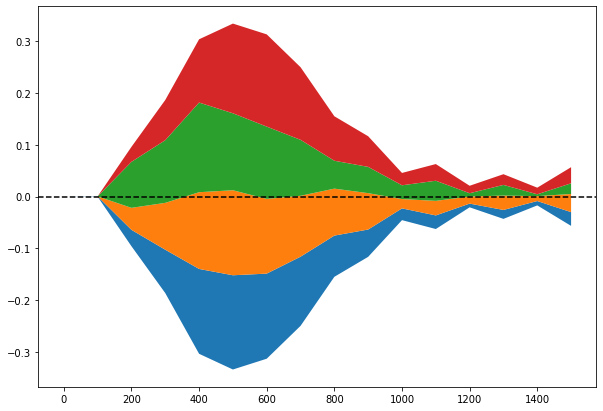

In [71]:
fig, ax = plt.subplots(figsize=(10, 7))
ax.stackplot(x, y, baseline="sym")
ax.axhline(0, color="black", ls="--");

In [72]:
from scipy import stats

In [73]:
def gaussian_smooth(x, y, grid, sd):
    weights = np.transpose([stats.norm.pdf(grid, m, sd) for m in x])
    weights = weights / weights.sum(0)
    return (weights * y).sum(1)

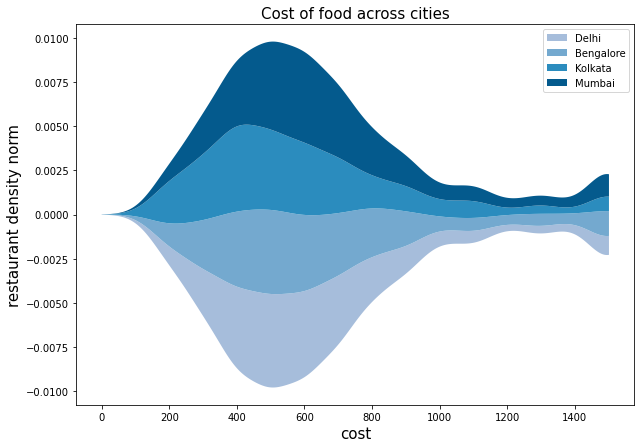

In [74]:
fig, ax = plt.subplots(figsize=(10, 7))
grid = np.linspace(0, 1501, num=500)
COLORS = ["#A6BDDB", "#74A9CF", "#2B8CBE", "#045A8D"]
y_smoothed = [gaussian_smooth(x, y_, grid, 60) for y_ in y]
ax.stackplot(grid, y_smoothed, colors=COLORS, baseline="sym")
plt.legend(['Delhi', 'Bengalore', 'Kolkata', 'Mumbai'])
plt.xlabel('cost', size=15)
plt.ylabel('restaurant density norm', size=15)
plt.title('Cost of food across cities', size=15);

In [78]:
import plotly.figure_factory as ff

hist_data = [delhi.cost_for_two.values, mumbai.cost_for_two.values, 
             bengaore.cost_for_two.values, kolkata.cost_for_two.values]

group_labels = ['Delhi', 'Mumbai', 'Bengalore', 'Kolkata']
# colors = ['#333F44', '#37AA9C', '#94F3E4']

# Create distplot with curve_type set to 'normal'
fig = ff.create_distplot(hist_data, group_labels, show_hist=False, bin_size=100, histnorm='probability')
# fig = ff.create_distplot(hist_data, group_labels, colors=COLORS, bin_size=100, show_curve=False)

# Add title
fig.update_layout(title_text='Cost distribution between cities',
                  height=700, width=1000, xaxis_title="Cost",
                  yaxis_title="Probability",)
fig.show()

In [79]:
popular_cuisine = {}
for cuisines in df.cusine.unique():
  cuisines_list = cuisines.split(', ')
  for cuisine in cuisines_list:
    count = popular_cuisine.get(cuisine, 0)
    popular_cuisine[cuisine] = count + 1
print(popular_cuisine)

{'Street Food': 740, 'Chinese': 4409, 'Fast Food': 2560, 'North Indian': 4996, 'Pizza': 931, 'Panini': 6, 'Sandwich': 642, 'South Indian': 1427, 'Italian': 2203, 'Continental': 2530, 'Asian': 841, 'Biryani': 1325, 'Mughlai': 1019, 'Kebab': 427, 'Bakery': 410, 'Desserts': 1280, 'Bengali': 166, 'American': 553, 'Cafe': 1177, 'Rolls': 549, 'Healthy Food': 468, 'Mithai': 281, 'Momos': 535, 'Ice Cream': 224, 'Mexican': 601, 'Beverages': 1730, 'Seafood': 955, 'Burger': 811, 'Rajasthani': 98, 'Kerala': 212, 'Andhra': 215, 'Finger Food': 350, 'Thai': 606, 'European': 428, 'Malwani': 128, 'Nepalese': 21, 'Bangladeshi': 4, 'Paan': 7, 'Juices': 262, 'Lebanese': 279, 'Japanese': 217, 'BBQ': 225, 'Salad': 602, 'Burmese': 50, 'Lucknowi': 66, 'Bihari': 23, 'Mediterranean': 272, 'Roast Chicken': 20, 'Wraps': 140, 'Modern Indian': 124, 'Ethiopian': 3, 'Hyderabadi': 142, 'Sushi': 103, 'Chettinad': 117, 'Kashmiri': 21, 'Middle Eastern': 52, 'Tibetan': 86, 'Mishti': 20, 'Korean': 52, 'Indian': 117, 'Parsi

In [80]:
top_10_cuisine = [k for k, _ in sorted(popular_cuisine.items(), key=lambda item: -item[1])][:10]
top_10_cuisine

['North Indian',
 'Chinese',
 'Fast Food',
 'Continental',
 'Italian',
 'Beverages',
 'South Indian',
 'Biryani',
 'Desserts',
 'Cafe']

In [81]:
top_10_cities = list(df.city.value_counts().index[:10].values)
top_10_cities

['Delhi NCR',
 'Mumbai',
 'Bengaluru',
 'Pune',
 'Kolkata',
 'Hyderabad',
 'Chennai',
 'Ahmedabad',
 'Jaipur',
 'Chandigarh']

In [82]:
df_heatmap = pd.DataFrame(dict(city=top_10_cities))

In [83]:
for cuisine in top_10_cuisine:
  agg = []
  for city in top_10_cities:
    avg_cost = df[(df.city == city) & (df.cusine.str.contains(cuisine))].cost_for_two.mean()
    agg.append(avg_cost)
  df_heatmap[cuisine] = pd.Series(agg)

In [84]:
df_heatmap = df_heatmap.set_index('city')
df_heatmap

,North Indian,Chinese,Fast Food,Continental,Italian,Beverages,South Indian,Biryani,Desserts,Cafe
city,,,,,,,,,,
Delhi NCR,742.353445,724.053012,472.241709,1236.777669,1149.141414,489.662822,542.212042,612.016807,491.753821,761.764706
Mumbai,817.488473,767.589528,507.271723,1316.035354,1179.783784,530.738994,571.498906,622.146119,486.994697,708.030303
Bengaluru,716.232048,670.067323,475.718016,1136.204380,1055.974843,474.058577,543.013699,573.519164,482.435897,669.287212
Pune,809.783433,786.382979,505.027174,1261.556604,1048.026316,522.558140,531.518625,598.721591,498.654244,588.817891
Kolkata,688.383751,636.334845,415.571635,1047.734139,956.949807,474.204947,471.683938,525.724638,464.035088,659.042553
Hyderabad,746.554904,723.624628,472.879684,1193.400000,1158.734940,427.192982,625.345745,624.570815,441.379310,711.864407
Chennai,778.940678,691.448008,459.983766,1294.982699,1071.245421,491.528239,648.463855,613.711584,524.063401,680.635838
Ahmedabad,734.819897,682.440476,504.198473,1042.783505,853.481013,474.774775,539.383562,610.000000,454.934211,661.486486
Jaipur,882.838915,848.534031,541.292135,1347.735849,1101.584699,426.562500,582.812500,500.000000,424.242424,658.928571


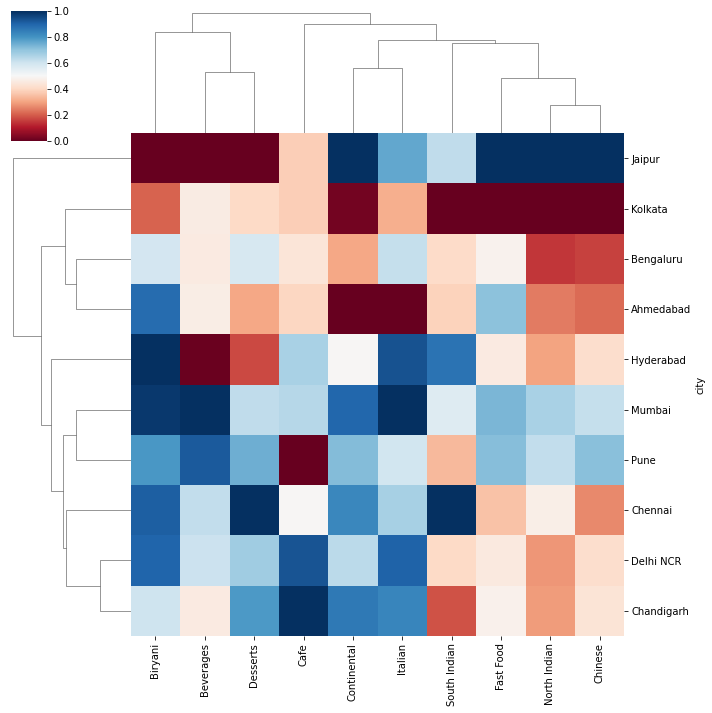

In [86]:
sns.clustermap(df_heatmap, standard_scale=1, cmap='RdBu');

In [87]:
bangalore.head()

,name,city,area,rating,rating_count,cusine,cost_for_two,timings,famous_food,longitude,latitude
38779,Cafe Kaara,Bengaluru,Ulsoor,4.3,188.0,"Cafe, Salad, Desserts, Pizza",750.0,"{'Mon': [0, 0, 0, 0, 0, 0, 0, 0, 0, 0.5, 1, 1,...","Coffee , Hot Chocolate , Pasta , Risotto , Tir...",77.617962,12.975299
38801,Hyderabad Biryani House,Bengaluru,Malleshwaram,4.2,291.0,"Biryani, Hyderabadi, Chinese",800.0,"{'Mon': [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0.5,...","Hyderabadi Biryani , Mutton Biryani , Chicken ...",77.571417,12.994095
38820,The Coffee Bean & Tea Leaf,Bengaluru,MG Road,4.0,308.0,Cafe,700.0,"{'Mon': [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0.5, 1,...","Coffee , Sandwich , Blueberry Muffin , Cappucc...",77.620303,12.973778
38839,Fly Dining,Bengaluru,Nagawara,3.8,137.0,"Continental, North Indian",14000.0,"{'Mon': [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0...","Pasta , Bruschettas",77.610328,13.047513
38859,Pot Biryani,Bengaluru,Domlur,3.8,497.0,"Biryani, North Indian, Chinese",650.0,"{'Mon': [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0.5,...","Pot Biryani , Boneless Biryani , Raita , Panee...",77.641729,12.954721


In [88]:
top_restaurants = bangalore.sort_values(by='rating', ascending=False)[:500]

In [89]:
popular_cuisine = {}
for cuisines in top_restaurants.cusine.unique():
  cuisines_list = cuisines.split(', ')
  for cuisine in cuisines_list:
    count = popular_cuisine.get(cuisine, 0)
    popular_cuisine[cuisine] = count + 1
print(popular_cuisine)

{'European': 28, 'Mediterranean': 23, 'North Indian': 123, 'BBQ': 23, 'Continental': 107, 'Italian': 62, 'South Indian': 31, 'Finger Food': 26, 'Pizza': 31, 'Ice Cream': 14, 'Desserts': 48, 'Asian': 63, 'Chinese': 74, 'Thai': 21, 'Momos': 8, 'Sushi': 10, 'Japanese': 17, 'Healthy Food': 12, 'Salad': 21, 'Steak': 7, 'Bar Food': 4, 'Cafe': 45, 'Kebab': 3, 'Beverages': 44, 'Burmese': 4, 'American': 31, 'Tex-Mex': 3, 'Burger': 24, 'Mexican': 8, 'Tea': 6, 'Modern Indian': 16, 'Mughlai': 14, 'Bakery': 12, 'Seafood': 22, 'Biryani': 21, 'Goan': 2, 'Spanish': 2, 'Cantonese': 1, 'Lucknowi': 1, 'Korean': 7, 'Fast Food': 30, 'Street Food': 6, 'Vietnamese': 5, 'Andhra': 7, 'Mangalorean': 9, 'Konkan': 3, 'Kerala': 3, 'Sandwich': 5, 'Indonesian': 2, 'Singaporean': 3, 'Rajasthani': 2, 'Malaysian': 3, 'Tibetan': 1, 'Mithai': 3, 'Gujarati': 2, 'African': 1, 'Wraps': 2, 'Juices': 1, 'Bengali': 2, 'Middle Eastern': 1, 'Rolls': 4, 'Awadhi': 1, 'French': 1, 'Portuguese': 1, 'Maharashtrian': 1, 'Arabian': 2, 

In [90]:
top_cuisine = [k for k, _ in sorted(popular_cuisine.items(), key=lambda item: -item[1])][:10]
top_cuisine

['North Indian',
 'Continental',
 'Chinese',
 'Asian',
 'Italian',
 'Desserts',
 'Cafe',
 'Beverages',
 'South Indian',
 'Pizza']

In [91]:
top_areas = top_restaurants.area.value_counts().index[:8].values
top_areas

array(['Koramangala', 'Indiranagar', 'HSR', 'Jayanagar', 'Whitefield',
       'Marathahalli', 'Kalyan Nagar', 'Sarjapur Road'], dtype=object)

In [92]:
df_heatmap = pd.DataFrame(dict(area=top_areas))

In [93]:
for cuisine in top_cuisine:
  agg = []
  for area in top_areas:
    avg_cost = top_restaurants[(top_restaurants.area == area) & (top_restaurants.cusine.str.contains(cuisine))].cost_for_two.mean()
    agg.append(avg_cost)
  df_heatmap[cuisine] = pd.Series(agg)

In [94]:
df_heatmap = df_heatmap.set_index('area')
df_heatmap.drop(columns=['Cafe', 'Pizza'], inplace=True)
df_heatmap.dropna(inplace=True)
df_heatmap

,North Indian,Continental,Chinese,Asian,Italian,Desserts,Beverages,South Indian
area,,,,,,,,
Koramangala,1198.437500,1178.846154,1230.555556,1407.142857,1246.153846,540.909091,690.000000,870.0
Indiranagar,1153.333333,1286.666667,1244.444444,1554.545455,1383.333333,642.857143,594.444444,1020.0
HSR,1021.428571,1295.000000,1000.000000,1433.333333,1400.000000,457.142857,662.500000,470.0
Jayanagar,783.333333,900.000000,800.000000,1100.000000,1033.333333,650.000000,450.000000,280.0
Whitefield,1780.000000,1883.333333,2020.000000,1844.444444,1675.000000,800.000000,766.666667,1900.0
Marathahalli,1500.000000,1600.000000,1783.333333,1433.333333,1200.000000,687.500000,500.000000,2700.0
Sarjapur Road,1575.000000,1562.500000,1250.000000,1425.000000,1550.000000,1500.000000,200.000000,1550.0


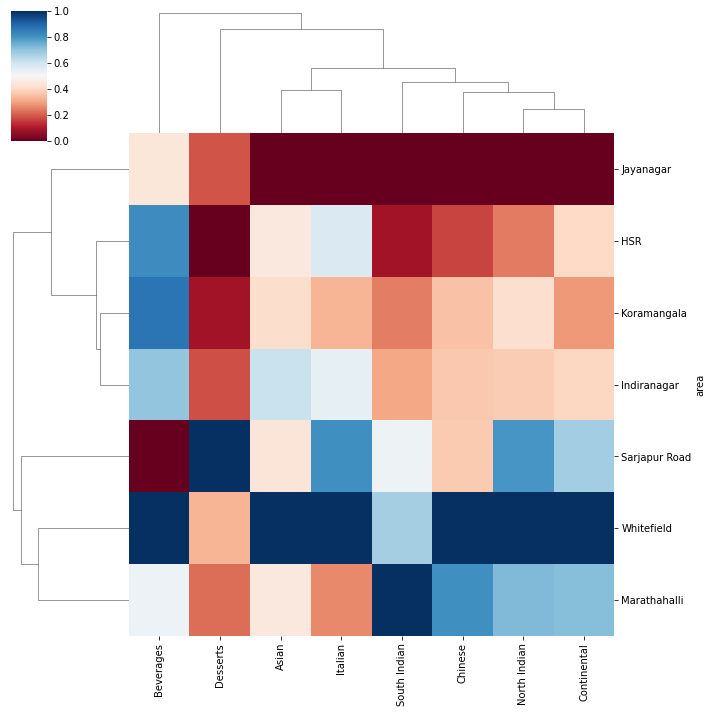

In [95]:
sns.clustermap(df_heatmap, standard_scale=1, cmap='RdBu');

# Operation time of restaurants

In [97]:
df = pd.read_csv('indian_restaurants_details_cleaned_data.csv')
df.drop(labels=['zomato_url', 'telephone', 'address',  
                'online_order', 'table_reservation', 'delivery_only', 'famous_food'], inplace=True, axis=1)
df.dropna(subset=['timings'], inplace=True)

In [98]:
df.shape

(221556, 10)

In [99]:
def get_timing(city):
  sum = np.zeros(24)
  timings = df[df.city==city].timings
  for timing in timings:
    timing = eval(timing)
    for key in timing.keys():
      sum += np.array(timing[key])
  return sum / len(timings)

In [100]:
delhi = get_timing('Delhi NCR')
bengalore = get_timing('Bengaluru')
kolkata = get_timing('Kolkata')
mumbai = get_timing('Mumbai')

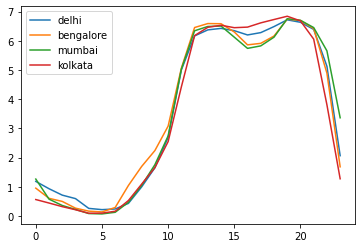

In [101]:
plt.plot(delhi, label='delhi')
plt.plot(bengalore, label='bengalore')
plt.plot(mumbai, label='mumbai')
plt.plot(kolkata, label='kolkata')
plt.legend();

In [102]:
time = []
for i in range(24):
  time.append(str(i))

In [104]:
import plotly.graph_objects as go

fig = go.Figure()

fig.add_trace(go.Scatterpolar(
      r=delhi,
      # fill='toself',
      name='Delhi'
))
fig.add_trace(go.Scatterpolar(
      r=bengalore,
      # fill='toself',
      name='Bengalore'
))
fig.add_trace(go.Scatterpolar(
      r=kolkata,
      # fill='toself',
      name='kolkata'
))
fig.add_trace(go.Scatterpolar(
      r=mumbai,
      # fill='toself',
      name='mumbai'
))

fig.update_layout(
  polar=dict(
    radialaxis=dict(
      visible=True,
      range=[0, 7]
    )),
  showlegend=True
)

fig.show()

# Voronoi for best restaurant per area

In [107]:
df = pd.read_csv('indian_restaurants_details_cleaned_data.csv')
bangalore = get_city_restaurants(df, 'Bengaluru')

In [108]:
def change(x):
  if x.startswith('Koramangala'):
    return x.split(' ')[0]
  return x

In [109]:
bangalore.area = bangalore.area.map(change)

In [110]:
bangalore.area.head()

38760          Domlur
38779          Ulsoor
38801    Malleshwaram
38820         MG Road
38839        Nagawara
Name: area, dtype: object

In [111]:
best = bangalore[(bangalore.rating > 4.5)].sort_values('cost_for_two')

In [112]:
best.area.unique()

array(['Banashankari', 'Basavanagudi', 'HSR', 'Jayanagar', 'Malleshwaram',
       'Indiranagar', 'Rajajinagar', 'Kalyan Nagar',
       'Varthur Main Road, Whitefield', 'Koramangala', 'Vijay Nagar',
       'Whitefield', 'Vasanth Nagar', 'Brigade Road', 'Shanti Nagar',
       'New BEL Road', 'Marathahalli', 'Church Street',
       'Rajarajeshwari Nagar', 'BTM', 'Cunningham Road', 'Sarjapur Road',
       'Electronic City', 'JP Nagar', 'Residency Road', 'Hennur',
       'Yelahanka', 'Yeshwantpur', 'Race Course Road', 'Old Airport Road',
       'Richmond Road', 'MG Road', 'Lavelle Road'], dtype=object)

In [113]:
best.sort_values('rating')[:5]

,zomato_url,name,city,area,rating,rating_count,telephone,cusine,cost_for_two,address,timings,online_order,table_reservation,delivery_only,famous_food,longitude,latitude
66619,https://www.zomato.com/bangalore/output-bengal...,Output Bengaluru,Bengaluru,Marathahalli,4.6,1384.0,080 49653064,"North Indian, Continental",1500.0,"Shop 36/4, 4th Floor, Soul Space Arena, Outer ...","{'Mon': [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0...",False,True,False,"Cocktails , Craft Beer , Pasta , Bbq Chicken P...",77.693371,12.980166
75354,https://www.zomato.com/bangalore/maziga-whitef...,Maziga,Bengaluru,Whitefield,4.6,473.0,080 49652198,Modern Indian,1500.0,"3rd Floor, VR Mall, B Narayanapura, Mahadevapu...","{'Mon': [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1...",True,True,False,"Biryani , Mocktails , Dal Makhani , Fish , Ris...",77.695240,12.996256
63522,https://www.zomato.com/bangalore/tipsy-bull-th...,Tipsy Bull - The Bar Exchange,Bengaluru,JP Nagar,4.6,550.0,080 49653138,"Chinese, Continental, North Indian, Mexican",1500.0,"603, 15th Cross, 100 Feet Ring Road, 6th Phase...","{'Mon': [1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1...",False,True,False,"Cocktails , Nachos , Pizza , Fries , Chicken W...",77.577558,12.906472
62719,https://www.zomato.com/koramangalasocial,Koramangala Social,Bengaluru,Koramangala,4.6,5212.0,080 43723295 080 43723095,"American, North Indian, Chinese, Asian, Biryan...",1500.0,"118, Koramangala Industrial Area, Koramangala ...","{'Mon': [0.5, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 1,...",True,False,False,"Cocktails , Long Island Iced Tea , Nachos , Pa...",77.614284,12.935441
62660,https://www.zomato.com/bangalore/the-pump-hous...,The Pump House,Bengaluru,JP Nagar,4.6,1506.0,+91 9606127666 +91 9606129666,"Continental, Finger Food",1500.0,"607, 15th Cross, Outer Ring Road, 1st Phase, J...","{'Mon': [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1...",False,True,False,"Beer , Cocktails , Pizza , Nachos , Fries , St...",77.582139,12.906545


In [114]:
collection = pd.DataFrame()
for area in bangalore.area.unique():
  best = bangalore[bangalore.area == area]
  k = best.sort_values('rating', ascending=False)[:10].sort_values('rating_count', ascending=False)[:5].sort_values('cost_for_two')[1:2]
  collection = collection.append(k)

In [115]:
collection.cost_for_two.mean()

678.735632183908

In [116]:
collection = filter_lat_long(collection)
collection

,zomato_url,name,city,area,rating,rating_count,telephone,cusine,cost_for_two,address,timings,online_order,table_reservation,delivery_only,famous_food,longitude,latitude
75015,https://www.zomato.com/bangalore/murphys-brewh...,Murphy's Brewhouse - The Paul Bangalore,Bengaluru,Domlur,4.3,2086.0,080 40477755 080 40477777,"Continental, North Indian, Finger Food",1700.0,"The Paul, 139/28, Off Intermediate Ring Road, ...","{'Mon': [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1...",False,True,False,"Chicken Bruschetta , Wheat Beer , Tandoori Chi...",77.639900,12.953824
45975,https://www.zomato.com/bangalore/marzipan-cafe...,Marzipan Cafe & Bakery,Bengaluru,Ulsoor,4.3,477.0,+91 9844422724 +91 9902069665,"Cafe, Mediterranean, Bakery, Greek, Beverages",900.0,"22, Ulsoor Road, (ground floor of Sunrise Cham...","{'Mon': [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1...",False,False,False,"Coffee , Cheesecake , Pasta , Hot Chocolate , ...",77.619141,12.974795
67248,https://www.zomato.com/bangalore/veena-stores-...,Veena Stores,Bengaluru,Malleshwaram,4.5,2547.0,080 23344838,South Indian,150.0,"187, 15th Cross, Margosa Road, Malleshwaram, B...","{'Mon': [0, 0, 0, 0, 0, 0, 0.5, 1, 1, 1, 1, 1,...",True,False,False,"Kesari Bath , Idli Vada , Sweet Pongal , Filte...",77.569212,13.005523
68509,https://www.zomato.com/bangalore/portland-stea...,Portland Steakhouse & Cafe,Bengaluru,MG Road,4.3,2137.0,080 25593405 080 41127142,"Steak, Italian, Continental, American, Burger,...",1500.0,"1, Brunton Road, 1st Cross, Ashok Nagar, MG Ro...","{'Mon': [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0.5,...",True,True,False,"Beef Steak , Burgers , Apple Pie , Spaghetti ,...",77.614819,12.970258
67184,https://www.zomato.com/bangalore/aromas-hydera...,Aroma's Hyderabad House,Bengaluru,Nagawara,4.2,733.0,+91 8970588888 +91 8970688888,"Mughlai, Biryani, North Indian, Chinese",800.0,"Opposite Manyatha Tech Park, Beside Honda Serv...","{'Mon': [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0.75...",True,False,False,"Vegetable Biryani , Hyderabadi Biryani , Raita...",77.619832,13.040641
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
181610,https://www.zomato.com/bangalore/barista-1-lan...,Barista,Bengaluru,Langford Town,NaN,NaN,+91 7022375531,"Cafe, Coffee, Fast Food, Beverages, Desserts",300.0,"4, Raksha Complex, O'Shaughnessy Road, Langfor...","{'Mon': [0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 1, 1, 1...",True,False,False,NaN,77.599529,12.959872
182953,https://www.zomato.com/bangalore/pulimunchi-sa...,Pulimunchi,Bengaluru,Sadashiv Nagar,4.1,550.0,080 23616678 +91 9741310329,"Mangalorean, Seafood",1000.0,"188/1, 1st Floor, Upper Palace Orchards, Sadas...","{'Mon': [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0...",True,True,False,"Neer Dosa , Tender Coconut Souffle , Sea Food ...",77.579054,13.006639
46811,https://www.zomato.com/bangalore/hushys-kitche...,Hushy's Kitchen,Bengaluru,Richmond Town,3.6,74.0,080 43007100 +91 9343361684,"Fast Food, Chinese, Burger",300.0,"Rhenius Road, Opposite Hockey Stadium, Richmon...","{'Mon': [1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1...",True,False,False,"Burgers , Biryani , Chicken Burger , Rolls , V...",77.601810,12.961361
60697,https://www.zomato.com/bangalore/the-raj-pavil...,The Raj Pavilion - ITC Windsor,Bengaluru,Sankey Road,4.2,400.0,080 61401224,"North Indian, Continental, Asian",2000.0,"ITC Windsor, 25 Windsor Square, Sankey Road, B...","{'Mon': [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1...",False,True,False,"Pizza , Hot Chocolate , Salad , Creme Brulee ,...",77.585229,12.994645


In [117]:
fig = px.scatter_mapbox(collection, lat="latitude", lon="longitude", hover_name="name", 
                        hover_data=["rating", "cusine", "cost_for_two", "area"],
                        size='cost_for_two', zoom=10, opacity=0.6,
                        size_max=20, color_discrete_sequence=['red'],
                        # color_continuous_scale=px.colors.sequential.Reds,
                        mapbox_style='outdoors', height=500, width=700, 
                        title='Best restaurants of the area')

fig.update_layout(margin={"r":0, "t":50, "l":0, "b":0})
fig.show()

In [118]:
from scipy.spatial import Voronoi, voronoi_plot_2d

In [119]:
vor = Voronoi(collection[['longitude', 'latitude']].values)

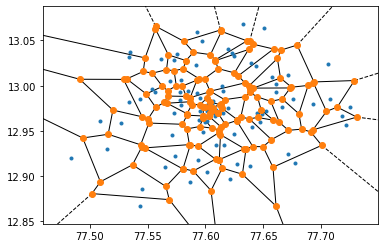

In [120]:
fig, ax = plt.subplots()
voronoi_plot_2d(vor, ax=ax)
plt.show()

# How frequently are these cuisines served together?

<img src='data:image/png;base64,iVBORw0KGgoAAAANSUhEUgAAAEAAAABACAYAAACqaXHeAAAABHNCSVQICAgIfAhkiAAAAAlwSFlz
AAAB+wAAAfsBxc2miwAAABl0RVh0U29mdHdhcmUAd3d3Lmlua3NjYXBlLm9yZ5vuPBoAAA6zSURB
VHic7ZtpeFRVmsf/5966taWqUlUJ2UioBBJiIBAwCZtog9IOgjqACsogKtqirT2ttt069nQ/zDzt
tI4+CrJIREFaFgWhBXpUNhHZQoKBkIUASchWla1S+3ar7r1nPkDaCAnZKoQP/D7mnPOe9/xy76n3
nFSAW9ziFoPFNED2LLK5wcyBDObkb8ZkxuaoSYlI6ZcOKq1eWFdedqNzGHQBk9RMEwFAASkk0Xw3
ETacDNi2vtvc7L0ROdw0AjoSotQVkKSvHQz/wRO1lScGModBFbDMaNRN1A4tUBCS3lk7BWhQkgpD
lG4852/+7DWr1R3uHAZVQDsbh6ZPN7CyxUrCzJMRouusj0ipRwD2uKm0Zn5d2dFwzX1TCGhnmdGo
G62Nna+isiUqhkzuKrkQaJlPEv5mFl2fvGg2t/VnzkEV8F5ioioOEWkLG86fvbpthynjdhXYZziQ
x1hC9J2NFyi8vCTt91Fh04KGip0AaG9zuCk2wQCVyoNU3Hjezee9bq92duzzTmxsRJoy+jEZZZYo
GTKJ6SJngdJqAfRzpze0+jHreUtPc7gpBLQnIYK6BYp/uGhw9YK688eu7v95ysgshcg9qSLMo3JC
4jqLKQFBgdKDPoQ+Pltb8dUyQLpeDjeVgI6EgLIQFT5tEl3rn2losHVsexbZ3EyT9wE1uGdkIPcy
BGxn8QUq1QrA5nqW5i2tLqvrrM9NK6AdkVIvL9E9bZL/oyfMVd/jqvc8LylzRBKDJSzIExwhQzuL
QYGQj4rHfFTc8mUdu3E7yoLtbTe9gI4EqVgVkug2i5+uXGo919ixbRog+3fTbQ8qJe4ZOYNfMoTI
OoshUNosgO60AisX15aeI2PSIp5KiFLI9ubb1vV3Qb2ltwLakUCDAkWX7/nHKRmmGIl9VgYsUhJm
2NXjKYADtM1ygne9QQDIXlk49FBstMKx66D1v4+XuQr7vqTe0VcBHQlRWiOCbmmSYe2SqtL6q5rJ
zsTb7lKx3FKOYC4DoqyS/B5bvLPxvD9Qtf6saxYLQGJErmDOdOMr/zo96km1nElr8bmPOBwI9COv
HnFPRIwmkSOv9kcAS4heRsidOkpeWBgZM+UBrTFAXNYL5Vf2ii9c1trNzpYdaoVil3WIc+wdk+gQ
noie3ecCcxt9ITcLAPWt/laGEO/9U6PmzZkenTtsSMQ8uYywJVW+grCstAvCIaAdArAsIWkRDDs/
KzLm2YcjY1Lv0UdW73HabE9n6V66cxSzfEmuJssTpKGVp+0vHq73FwL46eOjpMpbRAnNmJFrGJNu
Ukf9Yrz+3rghiumCKNXXWPhLYcjxGsIpoCMsIRoFITkW8AuyM8jC1+/QLx4bozCEJIq38+1rtpR6
V/yzb8eBlRb3fo5l783N0CWolAzJHaVNzkrTzlEp2bQ2q3TC5gn6wpnoQAmwSiGh2GitnTmVMc5O
UyfKWUKCIsU7+fZDKwqdT6DDpvkzAX4/+AMFjk0tDp5GRXLpQ2MUmhgDp5gxQT8+Y7hyPsMi8uxF
71H0oebujHALECjFKaW9Lm68n18wXp2kVzIcABytD5iXFzg+WVXkegpAsOOYziqo0OkK76GyquC3
ltZAzMhhqlSNmmWTE5T6e3IN05ITFLM4GdN0vtZ3ob8Jh1NAKXFbm5PtLU/eqTSlGjkNAJjdgn/N
aedXa0tdi7+t9G0FIF49rtMSEgAs1kDLkTPO7ebm4IUWeyh1bKomXqlgMG6kJmHcSM0clYLJ8XtR
1GTnbV3F6I5wCGikAb402npp1h1s7LQUZZSMIfALFOuL3UUrfnS8+rez7v9qcold5tilgHbO1fjK
9ubb17u9oshxzMiUBKXWqJNxd+fqb0tLVs4lILFnK71H0Ind7uiPgACVcFJlrb0tV6DzxqqTIhUM
CwDf1/rrVhTa33/3pGPxJYdQ2l2cbgVcQSosdx8uqnDtbGjh9SlDVSMNWhlnilfqZk42Th2ZpLpf
xrHec5e815zrr0dfBZSwzkZfqsv+1FS1KUknUwPARVvItfKUY+cn57yP7qv07UE3p8B2uhUwLk09
e0SCOrK+hbdYHYLjRIl71wWzv9jpEoeOHhGRrJAzyEyNiJuUqX0g2sBN5kGK6y2Blp5M3lsB9Qh4
y2Ja6x6+i0ucmKgwMATwhSjdUu49tKrQ/pvN5d53ml2CGwCmJipmKjgmyuaXzNeL2a0AkQ01Th5j
2DktO3Jyk8f9vcOBQHV94OK+fPumJmvQHxJoWkaKWq9Vs+yUsbq0zGT1I4RgeH2b5wef7+c7bl8F
eKgoHVVZa8ZPEORzR6sT1BzDUAD/d9F78e2Tzv99v8D+fLVTqAKAsbGamKey1Mt9Ann4eH3gTXTz
idWtAJ8PQWOk7NzSeQn/OTHDuEikVF1R4z8BQCy+6D1aWRfY0tTGG2OM8rRoPaeIj5ZHzJxszElN
VM8K8JS5WOfv8mzRnQAKoEhmt8gyPM4lU9SmBK1MCQBnW4KONT86v1hZ1PbwSXPw4JWussVjtH9Y
NCoiL9UoH/6PSu8jFrfY2t36erQHXLIEakMi1SydmzB31h3GGXFDFNPaK8Rme9B79Ixrd0WN+1ij
NRQ/doRmuFLBkHSTOm5GruG+pFjFdAmorG4IXH1Qua6ASniclfFtDYt+oUjKipPrCQB7QBQ2lrgP
fFzm+9XWUtcqJ3/5vDLDpJ79XHZk3u8nGZ42qlj1+ydtbxysCezrydp6ugmipNJ7WBPB5tydY0jP
HaVNzs3QzeE4ZpTbI+ZbnSFPbVOw9vsfnVvqWnirPyCNGD08IlqtYkh2hjZ5dErEQzoNm+6ykyOt
Lt5/PQEuSRRKo22VkydK+vvS1XEKlhCJAnsqvcVvH7f/ZU2R67eXbMEGAMiIV5oWZWiWvz5Fv2xG
sjqNJQRvn3Rs2lji/lNP19VjAQDgD7FHhujZB9OGqYxRkZxixgRDVlqS6uEOFaJUVu0rPFzctrnF
JqijImVp8dEKVWyUXDk92zAuMZ6bFwpBU1HrOw6AdhQgUooChb0+ItMbWJitSo5Ws3IAOGEOtL53
0vHZih9sC4vtofZ7Qu6523V/fmGcds1TY3V36pUsBwAbSlxnVh2xLfAD/IAIMDf7XYIkNmXfpp2l
18rkAJAy9HKFaIr/qULkeQQKy9zf1JgDB2uaeFNGijo5QsUyacNUUTOnGO42xSnv4oOwpDi1zYkc
efUc3I5Gk6PhyTuVKaOGyLUAYPGIoY9Pu/atL/L92+4q9wbflRJ2Trpm/jPjdBtfnqB/dIThcl8A
KG7hbRuKnb8qsQsVvVlTrwQAQMUlf3kwJI24Z4JhPMtcfng5GcH49GsrxJpGvvHIaeem2ma+KSjQ
lIwUdYyCY8j4dE1KzijNnIP2llF2wcXNnsoapw9XxsgYAl6k+KzUXbi2yP3KR2ecf6z3BFsBICdW
nvnIaG3eHybqX7vbpEqUMT+9OL4Qpe8VON7dXuFd39v19FoAABRVePbGGuXTszO0P7tu6lghUonE
llRdrhArLvmKdh9u29jcFiRRkfLUxBiFNiqSU9icoZQHo5mYBI1MBgBH6wMNb+U7Pnw337H4gi1Y
ciWs+uks3Z9fztUvfzxTm9Ne8XXkvQLHNytOOZeiD4e0PgkAIAYCYknKUNUDSXEKzdWNpnil7r4p
xqkjTarZMtk/K8TQ6Qve78qqvXurGwIJqcOUKfUWHsm8KGvxSP68YudXq4pcj39X49uOK2X142O0
Tz5/u/7TVybqH0rSya6ZBwD21/gubbrgWdDgEOx9W
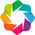

In [ ]:
import pandas as pd
import holoviews as hv
from holoviews import opts, dim
from bokeh.sampledata.les_mis import data
from bokeh.plotting import show

hv.extension('bokeh')
hv.output(size=200)

In [ ]:
df.dropna(subset=['cusine'], inplace=True)

In [ ]:
cuisines = []
for cuis in df.cusine:
  c = cuis.split(', ')
  cuisines.append(c)

In [ ]:
pair_dict = {}
for sample in cuisines:
  length = len(sample)
  if length > 1:
    sample = sorted(sample)
    for i in range(length):
      for j in range(i+1, length):
        pair_dict[(sample[i], sample[j])] = pair_dict.get((sample[i], sample[j]), 0) + 1

In [ ]:
cuisine_df = pd.DataFrame()
idx = 0
for key in pair_dict.keys():
  cuisine_df = cuisine_df.append(
      pd.DataFrame(
          {
              'source': key[0],
              'target': key[1],
              'value': pair_dict[key],
          },
          index = [idx]
      )
  )
  idx += 1

In [ ]:
cuisine_top = cuisine_df.sort_values(by=['value'], ascending=False).iloc[:50]

In [ ]:
cuisine_top.head()

,source,target,value
6,Chinese,North Indian,42533
24,North Indian,South Indian,12570
12,Fast Food,North Indian,11901
16,Chinese,South Indian,10986
0,Chinese,Fast Food,10823


In [ ]:
uniques = np.unique(np.concatenate([cuisine_top.source.values, cuisine_top.target.values]))

In [ ]:
def str_to_code(cuisine):
  return np.where(uniques==cuisine)[0][0]

In [ ]:
cuisine_top.source = cuisine_top.source.map(str_to_code)
cuisine_top.target = cuisine_top.target.map(str_to_code)

In [ ]:
cuisine_top.head()

,source,target,value
6,5,14,42533
24,14,19,12570
12,8,14,11901
16,5,19,10986
0,5,8,10823


In [ ]:
node_dict = pd.DataFrame()
for i in range(len(uniques)):
  node_dict = node_dict.append(
      pd.DataFrame(
          {
              'index': i,
              'name': uniques[i]
          },
          index = [i]
      )
  )

In [ ]:
node_dict.head()

,index,name
0,0,Bakery
1,1,Beverages
2,2,Biryani
3,3,Burger
4,4,Cafe


In [ ]:
nodes_c = hv.Dataset(node_dict, 'index')

In [ ]:
chord = hv.Chord((cuisine_top, nodes_c))
chord.opts(
    opts.Chord(cmap='Category20', edge_cmap='Category20', labels='name',
               node_color=dim('index').str(), edge_color=dim('source').str()))
show(hv.render(chord))

# T-SNE to cluster restaurants

In [121]:
df = pd.read_csv('indian_restaurants_details_cleaned_data.csv')
df.drop(labels=['zomato_url', 'telephone', 'address', 'famous_food'], inplace=True, axis=1)
df.dropna(inplace=True)

In [122]:
def change(x):
  if x.startswith('Koramangala'):
    return x.split(' ')[0]
  return x

In [123]:
bangalore = get_city_restaurants(df, 'Bengaluru')
bangalore.area = bangalore.area.map(change)
# bangalore.drop(labels=['name', 'city', 'latitude', 'longitude'], inplace=True, axis=1)
bangalore.head()

,name,city,area,rating,rating_count,cusine,cost_for_two,timings,online_order,table_reservation,delivery_only,longitude,latitude
38779,Cafe Kaara,Bengaluru,Ulsoor,4.3,188.0,"Cafe, Salad, Desserts, Pizza",750.0,"{'Mon': [0, 0, 0, 0, 0, 0, 0, 0, 0, 0.5, 1, 1,...",False,False,False,77.617962,12.975299
38801,Hyderabad Biryani House,Bengaluru,Malleshwaram,4.2,291.0,"Biryani, Hyderabadi, Chinese",800.0,"{'Mon': [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0.5,...",False,False,False,77.571417,12.994095
38820,The Coffee Bean & Tea Leaf,Bengaluru,MG Road,4.0,308.0,Cafe,700.0,"{'Mon': [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0.5, 1,...",True,False,False,77.620303,12.973778
38839,Fly Dining,Bengaluru,Nagawara,3.8,137.0,"Continental, North Indian",14000.0,"{'Mon': [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0...",False,False,False,77.610328,13.047513
38859,Pot Biryani,Bengaluru,Domlur,3.8,497.0,"Biryani, North Indian, Chinese",650.0,"{'Mon': [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0.5,...",True,False,False,77.641729,12.954721


In [124]:
time_d = {}
for i in range(24):
  time_d['time_{:02d}'.format(i)] = 0

In [125]:
df_time = pd.DataFrame()
for idx, row in bangalore.iterrows():
  time_dict = time_d
  timing = eval(row.timings)
  sum = np.zeros(24)
  for key in timing.keys():
    sum += np.array(timing[key])
  for i in range(24):
    time_dict['time_{:02d}'.format(i)] = sum[i]
  df_time = df_time.append(pd.DataFrame(time_dict, index=[idx]))

In [ ]:
bangalore.head()

,area,rating,rating_count,cusine,cost_for_two,timings,online_order,table_reservation,delivery_only
38779,Ulsoor,4.3,188.0,"Cafe, Salad, Desserts, Pizza",750.0,"{'Mon': [0, 0, 0, 0, 0, 0, 0, 0, 0, 0.5, 1, 1,...",False,False,False
38801,Malleshwaram,4.2,291.0,"Biryani, Hyderabadi, Chinese",800.0,"{'Mon': [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0.5,...",False,False,False
38820,MG Road,4.0,308.0,Cafe,700.0,"{'Mon': [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0.5, 1,...",True,False,False
38839,Nagawara,3.8,137.0,"Continental, North Indian",14000.0,"{'Mon': [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0...",False,False,False
38859,Domlur,3.8,497.0,"Biryani, North Indian, Chinese",650.0,"{'Mon': [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0.5,...",True,False,False


In [ ]:
df_time.head()

,time_00,time_01,time_02,time_03,time_04,time_05,time_06,time_07,time_08,time_09,time_10,time_11,time_12,time_13,time_14,time_15,time_16,time_17,time_18,time_19,time_20,time_21,time_22,time_23
38779,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,3.5,7.0,7.0,7.0,7.0,7.0,7.0,7.0,7.0,7.0,7.0,7.0,7.0,0.0,0.0
38801,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,3.5,7.0,7.0,7.0,7.0,7.0,7.0,7.0,7.0,7.0,7.0,7.0,3.5
38820,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,3.5,7.0,7.0,7.0,7.0,7.0,7.0,7.0,7.0,7.0,7.0,7.0,7.0,0.0
38839,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,7.0,7.0,7.0,7.0,7.0,7.0,7.0,7.0,7.0,0.0
38859,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,3.5,7.0,7.0,7.0,4.0,1.0,1.0,4.0,7.0,7.0,7.0,7.0,0.0


In [ ]:
df_merged = bangalore.merge(df_time, how='outer', left_index=True, right_index=True)
df_merged.drop(columns=['timings'], inplace=True)
df_merged.head()

,area,rating,rating_count,cusine,cost_for_two,online_order,table_reservation,delivery_only,time_00,time_01,time_02,time_03,time_04,time_05,time_06,time_07,time_08,time_09,time_10,time_11,time_12,time_13,time_14,time_15,time_16,time_17,time_18,time_19,time_20,time_21,time_22,time_23
38779,Ulsoor,4.3,188.0,"Cafe, Salad, Desserts, Pizza",750.0,False,False,False,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,3.5,7.0,7.0,7.0,7.0,7.0,7.0,7.0,7.0,7.0,7.0,7.0,7.0,0.0,0.0
38801,Malleshwaram,4.2,291.0,"Biryani, Hyderabadi, Chinese",800.0,False,False,False,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,3.5,7.0,7.0,7.0,7.0,7.0,7.0,7.0,7.0,7.0,7.0,7.0,3.5
38820,MG Road,4.0,308.0,Cafe,700.0,True,False,False,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,3.5,7.0,7.0,7.0,7.0,7.0,7.0,7.0,7.0,7.0,7.0,7.0,7.0,0.0
38839,Nagawara,3.8,137.0,"Continental, North Indian",14000.0,False,False,False,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,7.0,7.0,7.0,7.0,7.0,7.0,7.0,7.0,7.0,0.0
38859,Domlur,3.8,497.0,"Biryani, North Indian, Chinese",650.0,True,False,False,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,3.5,7.0,7.0,7.0,4.0,1.0,1.0,4.0,7.0,7.0,7.0,7.0,0.0


In [ ]:
area_dummies = pd.get_dummies(df_merged['area'])

In [ ]:
df_merged = df_merged.merge(area_dummies, how='outer', left_index=True, right_index=True)
df_merged.drop(columns=['area'], inplace=True)
df_merged.head()

,rating,rating_count,cusine,cost_for_two,online_order,table_reservation,delivery_only,time_00,time_01,time_02,time_03,time_04,time_05,time_06,time_07,time_08,time_09,time_10,time_11,time_12,time_13,time_14,time_15,time_16,time_17,time_18,time_19,time_20,time_21,time_22,time_23,BTM,Banashankari,Banaswadi,Bannerghatta Road,Basavanagudi,Basaveshwara Nagar,Bellandur,Bommanahalli,Brigade Road,...,Majestic,Malleshwaram,Marathahalli,Mysore Road,Nagarbhavi,Nagawara,New BEL Road,North Bangalore,Old Airport Road,Old Madras Road,Peenya,RT Nagar,Race Course Road,Rajajinagar,Rajarajeshwari Nagar,Rammurthy Nagar,Residency Road,Richmond Road,Richmond Town,Sadashiv Nagar,Sahakara Nagar,Sanjay Nagar,Sankey Road,Sarjapur Road,Seshadripuram,Shanti Nagar,Shivajinagar,South Bangalore,St. Marks Road,Thippasandra,Ulsoor,Uttarahalli,"Varthur Main Road, Whitefield",Vasanth Nagar,Vijay Nagar,West Bangalore,Whitefield,Wilson Garden,Yelahanka,Yeshwantpur
38779,4.3,188.0,"Cafe, Salad, Desserts, Pizza",750.0,False,False,False,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,3.5,7.0,7.0,7.0,7.0,7.0,7.0,7.0,7.0,7.0,7.0,7.0,7.0,0.0,0.0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0
38801,4.2,291.0,"Biryani, Hyderabadi, Chinese",800.0,False,False,False,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,3.5,7.0,7.0,7.0,7.0,7.0,7.0,7.0,7.0,7.0,7.0,7.0,3.5,0,0,0,0,0,0,0,0,0,...,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
38820,4.0,308.0,Cafe,700.0,True,False,False,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,3.5,7.0,7.0,7.0,7.0,7.0,7.0,7.0,7.0,7.0,7.0,7.0,7.0,0.0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
38839,3.8,137.0,"Continental, North Indian",14000.0,False,False,False,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,7.0,7.0,7.0,7.0,7.0,7.0,7.0,7.0,7.0,0.0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
38859,3.8,497.0,"Biryani, North Indian, Chinese",650.0,True,False,False,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,3.5,7.0,7.0,7.0,4.0,1.0,1.0,4.0,7.0,7.0,7.0,7.0,0.0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0


In [ ]:
popular_cuisine = {}
for cuisines in df_merged.cusine.unique():
  cuisines_list = cuisines.split(', ')
  for cuisine in cuisines_list:
    count = popular_cuisine.get(cuisine, 0)
    popular_cuisine[cuisine] = count + 1
print(popular_cuisine)

{'Cafe': 267, 'Salad': 102, 'Desserts': 263, 'Pizza': 169, 'Biryani': 447, 'Hyderabadi': 50, 'Chinese': 1048, 'Continental': 508, 'North Indian': 1242, 'Asian': 168, 'European': 75, 'Italian': 305, 'Korean': 17, 'Malaysian': 12, 'Thai': 95, 'Sushi': 13, 'Finger Food': 96, 'Seafood': 251, 'Bakery': 80, 'Afghan': 9, 'Ice Cream': 88, 'Bengali': 57, 'Momos': 89, 'Fast Food': 561, 'Mediterranean': 64, 'French': 11, 'Tea': 35, 'Mangalorean': 88, 'South Indian': 448, 'Beverages': 406, 'Rolls': 156, 'Kebab': 81, 'Kerala': 135, 'Rajasthani': 18, 'Spanish': 6, 'Burger': 168, 'BBQ': 77, 'Mughlai': 179, 'Steak': 48, 'Street Food': 193, 'Mithai': 46, 'American': 121, 'Andhra': 159, 'Juices': 92, 'Arabian': 132, 'Turkish': 13, 'Tibetan': 17, 'Nepalese': 4, 'Konkan': 10, 'Japanese': 34, 'Mexican': 55, 'Lebanese': 27, 'Vietnamese': 18, 'Chettinad': 31, 'Healthy Food': 85, 'Sandwich': 113, 'Bar Food': 19, 'Goan': 10, 'Wraps': 12, 'Odia': 23, 'Naga': 5, 'North Eastern': 6, 'Modern Indian': 25, 'Gujarati

In [ ]:
cuisines = list(popular_cuisine.keys())

In [ ]:
df_cuisine = pd.DataFrame()
for idx, row in df_merged.iterrows():
  for i in cuisines:
    cuisine_dict[i] = 0
  c_list = row.cusine.split(', ')
  for c in c_list:
    cuisine_dict[c] = 1
  df_cuisine = df_cuisine.append(pd.DataFrame(cuisine_dict, index=[idx]))

In [ ]:
df_cuisine.tail()

,Cafe,Salad,Desserts,Pizza,Biryani,Hyderabadi,Chinese,Continental,North Indian,Asian,European,Italian,Korean,Malaysian,Thai,Sushi,Finger Food,Seafood,Bakery,Afghan,Ice Cream,Bengali,Momos,Fast Food,Mediterranean,French,Tea,Mangalorean,South Indian,Beverages,Rolls,Kebab,Kerala,Rajasthani,Spanish,Burger,BBQ,Mughlai,Steak,Street Food,...,Naga,North Eastern,Modern Indian,Gujarati,Kashmiri,Bihari,Awadhi,Lucknowi,Maharashtrian,Indonesian,Coffee,Paan,Middle Eastern,Drinks Only,Sri Lankan,Iranian,German,Charcoal Chicken,Australian,Greek,Roast Chicken,Singaporean,Bubble Tea,Raw Meats,Hot dogs,Bohri,Assamese,Belgian,Tamil,Grill,Tex-Mex,Frozen Yogurt,Parsi,Mongolian,Burmese,Cantonese,Portuguese,British,Sindhi,African
190148,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
190158,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
190175,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
190193,0,0,0,0,0,0,1,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
190213,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0


In [ ]:
df_merged = df_merged.merge(df_cuisine, how='outer', left_index=True, right_index=True)
df_merged.drop(columns=['cusine'], inplace=True)
df_merged.head()

,rating,rating_count,cost_for_two,online_order,table_reservation,delivery_only,time_00,time_01,time_02,time_03,time_04,time_05,time_06,time_07,time_08,time_09,time_10,time_11,time_12,time_13,time_14,time_15,time_16,time_17,time_18,time_19,time_20,time_21,time_22,time_23,BTM,Banashankari,Banaswadi,Bannerghatta Road,Basavanagudi,Basaveshwara Nagar,Bellandur,Bommanahalli,Brigade Road,Brookefield,...,Naga,North Eastern,Modern Indian,Gujarati,Kashmiri,Bihari,Awadhi,Lucknowi,Maharashtrian,Indonesian,Coffee,Paan,Middle Eastern,Drinks Only,Sri Lankan,Iranian,German,Charcoal Chicken,Australian,Greek,Roast Chicken,Singaporean,Bubble Tea,Raw Meats,Hot dogs,Bohri,Assamese,Belgian,Tamil,Grill,Tex-Mex,Frozen Yogurt,Parsi,Mongolian,Burmese,Cantonese,Portuguese,British,Sindhi,African
38779,4.3,188.0,750.0,False,False,False,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,3.5,7.0,7.0,7.0,7.0,7.0,7.0,7.0,7.0,7.0,7.0,7.0,7.0,0.0,0.0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
38801,4.2,291.0,800.0,False,False,False,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,3.5,7.0,7.0,7.0,7.0,7.0,7.0,7.0,7.0,7.0,7.0,7.0,3.5,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
38820,4.0,308.0,700.0,True,False,False,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,3.5,7.0,7.0,7.0,7.0,7.0,7.0,7.0,7.0,7.0,7.0,7.0,7.0,0.0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
38839,3.8,137.0,14000.0,False,False,False,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,7.0,7.0,7.0,7.0,7.0,7.0,7.0,7.0,7.0,0.0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
38859,3.8,497.0,650.0,True,False,False,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,3.5,7.0,7.0,7.0,4.0,1.0,1.0,4.0,7.0,7.0,7.0,7.0,0.0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0


In [126]:
# df_merged.to_csv('tsne_bangalore.csv', index=False)
df_merged = pd.read_csv('tsne_bangalore.csv')

### TSNE within area

In [127]:
df_merged[df_merged.columns[30:117]]

,BTM,Banashankari,Banaswadi,Bannerghatta Road,Basavanagudi,Basaveshwara Nagar,Bellandur,Bommanahalli,Brigade Road,Brookefield,...,Ulsoor,Uttarahalli,"Varthur Main Road, Whitefield",Vasanth Nagar,Vijay Nagar,West Bangalore,Whitefield,Wilson Garden,Yelahanka,Yeshwantpur
0,0,0,0,0,0,0,0,0,0,0,...,1,0,0,0,0,0,0,0,0,0
1,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
2,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
3,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
4,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
13087,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
13088,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
13089,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
13090,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


In [128]:
cols_to_remove = list(df_merged.columns[30:117])
cols_to_remove.remove('Koramangala')

In [129]:
df_merged_kor = df_merged.drop(columns=cols_to_remove)
df_merged_kor = df_merged_kor[df_merged_kor['Koramangala']==1]
df_merged_kor.drop(columns=['Koramangala'], inplace=True)
df_merged_kor.head()

,rating,rating_count,cost_for_two,online_order,table_reservation,delivery_only,time_00,time_01,time_02,time_03,...,Tex-Mex,Frozen Yogurt,Parsi,Mongolian,Burmese,Cantonese,Portuguese,British,Sindhi,African
27,3.8,29.0,500.0,True,False,False,7.00,7.0,0.0,0.0,...,0,0,0,0,0,0,0,0,0,0
38,4.1,1441.0,1300.0,False,False,False,1.75,0.0,0.0,0.0,...,0,0,0,0,0,0,0,0,0,0
50,3.8,30.0,800.0,False,False,False,0.00,0.0,0.0,0.0,...,0,0,0,0,0,0,0,0,0,0
65,2.7,49.0,800.0,False,False,False,0.00,0.0,0.0,0.0,...,0,0,0,0,0,0,0,0,0,0
75,3.6,98.0,300.0,True,False,False,0.00,0.0,0.0,0.0,...,0,0,0,0,0,0,0,0,0,0


In [130]:
df_norm = (df_merged_kor - df_merged_kor.mean()) / df_merged_kor.std()
df_norm.dropna(axis=1, inplace=True)
df_norm.head()

,rating,rating_count,cost_for_two,online_order,table_reservation,delivery_only,time_00,time_01,time_02,time_03,...,Indonesian,Coffee,Middle Eastern,Sri Lankan,Singaporean,Raw Meats,Hot dogs,Assamese,Parsi,Burmese
27,0.048110,-0.373010,-0.142731,0.808688,-0.409714,-0.327782,1.810611,2.588419,-0.354653,-0.255785,...,-0.034627,-0.069379,-0.049,-0.034627,-0.034627,-0.034627,-0.034627,-0.060048,-0.049,-0.034627
38,0.720576,0.781396,1.980567,-1.235088,-0.409714,-0.327782,0.003920,-0.399163,-0.354653,-0.255785,...,-0.034627,-0.069379,-0.049,-0.034627,-0.034627,-0.034627,-0.034627,-0.060048,-0.049,-0.034627
50,0.048110,-0.372192,0.653506,-1.235088,-0.409714,-0.327782,-0.598310,-0.399163,-0.354653,-0.255785,...,-0.034627,-0.069379,-0.049,-0.034627,-0.034627,-0.034627,-0.034627,-0.060048,-0.049,-0.034627
65,-2.417597,-0.356659,0.653506,-1.235088,-0.409714,-0.327782,-0.598310,-0.399163,-0.354653,-0.255785,...,-0.034627,-0.069379,-0.049,-0.034627,-0.034627,-0.034627,-0.034627,-0.060048,-0.049,-0.034627
75,-0.400200,-0.316598,-0.673555,0.808688,-0.409714,-0.327782,-0.598310,-0.399163,-0.354653,-0.255785,...,-0.034627,-0.069379,-0.049,-0.034627,-0.034627,-0.034627,-0.034627,-0.060048,-0.049,-0.034627


In [132]:
from sklearn.manifold import TSNE
tsne = TSNE(n_components=2, perplexity=100)
k = tsne.fit_transform(df_norm)

In [133]:
k.shape

(834, 2)

In [134]:
bangalore = get_city_restaurants(df, 'Bengaluru')
bangalore.head()

,name,city,area,rating,rating_count,cusine,cost_for_two,timings,online_order,table_reservation,delivery_only,longitude,latitude
38779,Cafe Kaara,Bengaluru,Ulsoor,4.3,188.0,"Cafe, Salad, Desserts, Pizza",750.0,"{'Mon': [0, 0, 0, 0, 0, 0, 0, 0, 0, 0.5, 1, 1,...",False,False,False,77.617962,12.975299
38801,Hyderabad Biryani House,Bengaluru,Malleshwaram,4.2,291.0,"Biryani, Hyderabadi, Chinese",800.0,"{'Mon': [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0.5,...",False,False,False,77.571417,12.994095
38820,The Coffee Bean & Tea Leaf,Bengaluru,MG Road,4.0,308.0,Cafe,700.0,"{'Mon': [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0.5, 1,...",True,False,False,77.620303,12.973778
38839,Fly Dining,Bengaluru,Nagawara,3.8,137.0,"Continental, North Indian",14000.0,"{'Mon': [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0...",False,False,False,77.610328,13.047513
38859,Pot Biryani,Bengaluru,Domlur,3.8,497.0,"Biryani, North Indian, Chinese",650.0,"{'Mon': [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0.5,...",True,False,False,77.641729,12.954721


In [136]:
bangalore_tsne = bangalore.iloc[df_norm.index]
bangalore_tsne['tsne_0'] = k[:, 0]
bangalore_tsne['tsne_1'] = k[:, 1]
bangalore_tsne.dropna(inplace=True)

In [137]:
fig = px.scatter(bangalore_tsne, x="tsne_0", y="tsne_1", color='rating', size="cost_for_two" , size_max=25, 
                  hover_data=['name', 'rating', 'cost_for_two', 'cusine'],)
fig.update_layout(title_text='T-SNE for Koramangala area',
                  height=700, width=1000)
fig.show()

# Random but cool stuff


In [ ]:
import matplotlib.image as image
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd

from matplotlib.lines import Line2D
from matplotlib.offsetbox import OffsetImage, AnnotationBbox
from scipy import stats

In [ ]:
plt.rcParams.update({"font.family": "Reem Kufi"})

In [ ]:
def adjust_lightness(color, amount=0.5):
    import matplotlib.colors as mc
    import colorsys
    try:
        c = mc.cnames[color]
    except:
        c = color
    c = colorsys.rgb_to_hls(*mc.to_rgb(c))
    return colorsys.hls_to_rgb(c[0], c[1] * amount, c[2])

In [ ]:
df_char_vis = pd.read_csv(
    "https://raw.githubusercontent.com/rfordatascience/tidytuesday/master/data/2020/2020-06-30/character_visualization.csv"
)

In [ ]:
df_best_chars = pd.DataFrame({
    "rank": np.linspace(1, 10, num=10),
    "char_popular": ["Wolverine", "Magneto", "Nightcrawler", "Gambit",
                     "Storm", "Colossus", "Phoenix", "Professor X", 
                     "Iceman", "Rogue"]
})

In [ ]:
for character in df_best_chars["char_popular"]:
    idxs = df_char_vis["character"].str.contains(character)
    df_char_vis.loc[idxs, "character_join"] = character

In [ ]:
df_best_stream = (
    pd.merge(df_char_vis, df_best_chars, left_on="character_join", right_on="char_popular")
    .groupby(["character", "char_popular", "costume", "rank", "issue"]).agg(
        speech = ("speech", sum),
        thought = ("thought", sum),
        narrative = ("narrative", sum),
        depicted = ("depicted", sum),
    )
    .query("rank <= 5")   # keep only the top 5 characters
    .query("issue < 281") 
    .reset_index()
)

In [ ]:
# Costume is either 'customed' or 'casual'
df_best_stream["costume"] = np.where(df_best_stream["costume"] == "Costume", "costumed", "casual")

# char_costume contains the name of the character and the costume
df_best_stream["char_costume"] = df_best_stream["char_popular"] + " (" + df_best_stream["costume"] + ")"

# Record the categories of 'char_costume'. 
# This will be used for the order of the areas in the streamchart.
CATEGORIES = df_best_stream.sort_values(by=["rank", "char_costume"])["char_costume"].unique()
CATEGORIES = CATEGORIES[::-1]

# Put the data in long form
df_best_stream = pd.melt(
    df_best_stream,
    id_vars = ["character", "char_popular", "costume", "rank", "issue", "char_costume"],
    value_vars = ["speech", "thought", "narrative", "depicted"],
    var_name = "parameter",
    value_name = "value"
)

In [ ]:
df_best_stream = df_best_stream.sort_values(by = ["char_costume", "issue"])
df_best_stream = df_best_stream.groupby(["char_costume", "issue", "parameter"]).agg(
    value = ("value", np.mean)
).reset_index()

In [ ]:
PALETTE = [
    adjust_lightness("#595A52", 1.25), "#595A52",
    adjust_lightness("#8E038E", 1.2), "#8E038E",
    adjust_lightness("#13AFEF", 1.25), "#13AFEF",
    adjust_lightness("#C20008", 1.2), "#C20008",
    adjust_lightness("#FFB400", 1.25), "#FFB400"
]

GREY25 = "#404040"
GREY30 = "#4d4d4d"
GREY40 = "#666666"
GREY88 = "#e0e0e0"
GREY95 = "#f2f2f2"

# IMAGE = image.imread("uncannyxmen.png")

XTICKS = [97, 125, 150, 175, 200, 225, 250, 280]

In [ ]:
def gaussian_smooth(x, y, grid, sd):
    weights = np.transpose([stats.norm.pdf(grid, m, sd) for m in x])
    weights = weights / weights.sum(0)
    return (weights * y).sum(1)

In [ ]:
df_depicted = df_best_stream.query("parameter == 'depicted'")

issues = [
    df_depicted[df_depicted["char_costume"] == character]["issue"].values
    for character in CATEGORIES
]
values = [
    df_depicted[df_depicted["char_costume"] == character]["value"].values
    for character in CATEGORIES
]

grid = np.linspace(80, 300, num=1000)

findfont: Font family ['Reem Kufi'] not found. Falling back to DejaVu Sans.


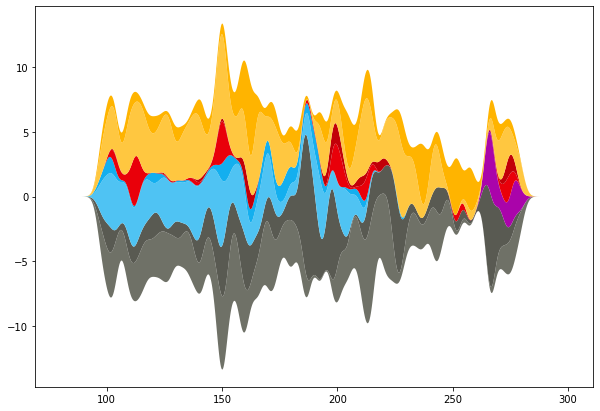

In [ ]:
# Basic stacked area chart.
fig, ax = plt.subplots(figsize=(10, 7))

# sd=2 is the standard deviation of the Gaussian function.
values_smoothed = [gaussian_smooth(x, y, grid, sd=2) for x, y in zip(issues, values)]
ax.stackplot(grid, values_smoothed, colors=PALETTE, baseline="sym");

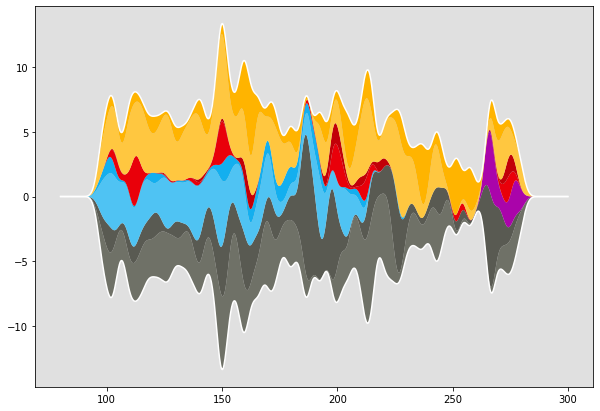

In [ ]:
# Set background color
ax.set_facecolor(GREY88)

# This 'line' is the sum of values for each issue.
line = np.array(values_smoothed).sum(0)
# Two lines are added, one on top, another on the bottom.
# Both have the same height because of `baseline="sym"`
ax.plot(grid, line / 2, lw=1.5, color="white")
ax.plot(grid, -line / 2, lw=1.5, color="white")
fig

In [ ]:
def streamgraph(df, parameter, ax, grid, sd=2):
    # Keep rows for the given 'parameter'
    df = df[df["parameter"] == parameter]
    
    # Same logic than above
    issues = [
        df[df["char_costume"] == character]["issue"].values
        for character in CATEGORIES
    ]
    values = [
        df[df["char_costume"] == character]["value"].values
        for character in CATEGORIES
    ]
    # Smooth values
    values_smoothed = [gaussian_smooth(x, y, grid, sd) for x, y in zip(issues, values)]
    
    # Add streamchart
    ax.stackplot(grid, values_smoothed, colors=PALETTE, baseline="sym")
    
    # Add border lines
    line = np.array(values_smoothed).sum(0)
    ax.plot(grid, line / 2, lw=1.5, color="white")
    ax.plot(grid, -line / 2, lw=1.5, color="white")
    
    # Vertical lines
    for x in XTICKS:
        ax.axvline(x, color=GREY88, ls=(0, (1, 2)), zorder=10)
    
    # Change background color and remove both axis
    ax.set_facecolor(GREY88)
    ax.yaxis.set_visible(False)
    ax.xaxis.set_visible(False)
    
    # Also remove all spines
    ax.spines["left"].set_color("none")
    ax.spines["bottom"].set_color("none")
    ax.spines["right"].set_color("none")
    ax.spines["top"].set_color("none")

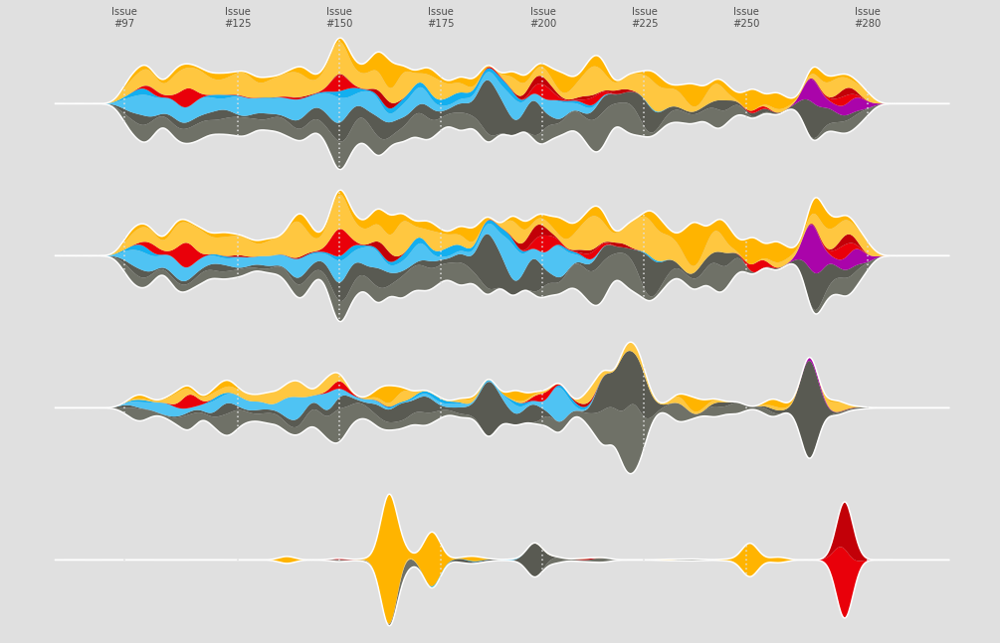

In [ ]:
# Some layout stuff ----------------------------------------------
# sharex=True ensures each panel has the same horizontal range
fig, ax = plt.subplots(4, 1, figsize=(14, 10.5), sharex=True)

# Background color for the figure (not each axis)
fig.patch.set_facecolor(GREY88)

# Adjust space between panels
fig.subplots_adjust(left=0.01, bottom=0.1, right=0.99, top=0.9, hspace=0.05)

# Add streamcharts -----------------------------------------------
# This loops along the four axes in the figure.
grid = np.linspace(80, 300, num=1000)
for idx, parameter in enumerate(["depicted", "speech", "thought", "narrative"]):
    streamgraph(df_best_stream, parameter, ax[idx], grid)


# Add label for horizontal axis ----------------------------------
# Note this is only modifying the labels for `ax[0]`, the top panel.

ax[0].xaxis.set_visible(True)
ax[0].tick_params(axis="x", labeltop=True, length=0)
ax[0].set_xticks(XTICKS)
ax[0].set_xticklabels([f"Issue\n#{x}" for x in XTICKS], color=GREY30);

findfont: Font family ['Reem Kufi'] not found. Falling back to DejaVu Sans.


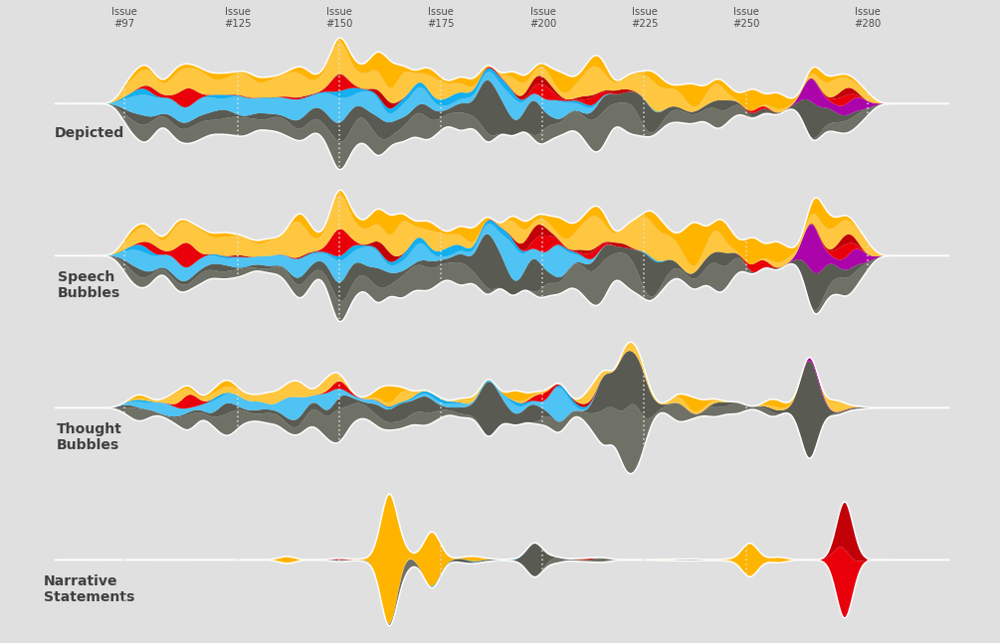

In [ ]:
# Add labels for each panel axis ---------------------------------
# These labels indicate which type of appearence is represented
# on each panel.

levels = ["depicted", "speech", "thought", "narrative"]
labels = pd.DataFrame({
    "issue": [78] * 4,
    "value": [-21, -19, -14, -11],
    "parameter": pd.Categorical(levels, levels),
    "label": ["Depicted", "Speech\nBubbles", "Thought\nBubbles", "Narrative\nStatements"]
})

for idx, row in labels.iterrows():
    ax[idx].text(
        0.08, 
        0.3, 
        row["label"], 
        ha="center",
        va="center",
        ma="left",
        color=GREY25,
        size=14,
        weight=900,
        transform=ax[idx].transAxes,

    )
fig

findfont: Font family ['Reem Kufi'] not found. Falling back to DejaVu Sans.


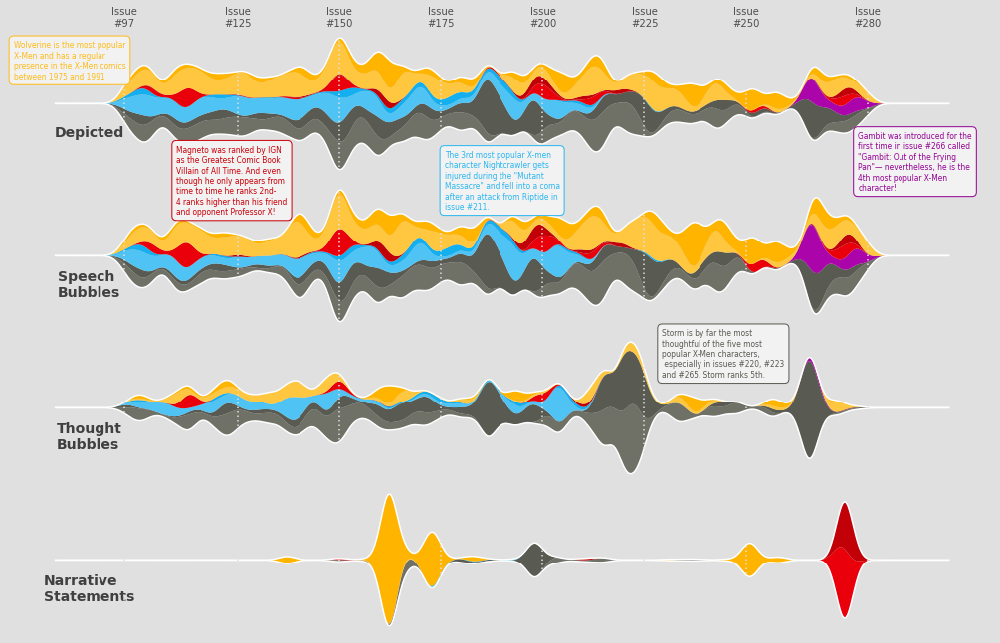

In [ ]:
# Add informative text -------------------------------------------

# The dictionaries in TEXTS contain all the information needed
# to add all the text blocks: the text, the axis where
# the text is placed, the xy location, and the color.


TEXTS = [
    {
        "text": 'Gambit was introduced for the\nfirst time in issue #266 called\n"Gambit: Out of the Frying\nPan"— nevertheless, he is the\n4th most popular X-Men\ncharacter!',
        "ax": 0,
        "x": 0.92,
        "y": 0.1,
        "color": adjust_lightness("#8E038E", 1.05)
    },
    {
        "text": 'Wolverine is the most popular\nX-Men and has a regular\npresence in the X-Men comics\nbetween 1975 and 1991',
        "ax": 0,
        "x": 0.06,
        "y": 0.80,
        "color": adjust_lightness("#FFB400", 1.1)
    },
    {
        "text": 'Storm is by far the most\nthoughtful of the five most\npopular X-Men characters,\n especially in issues #220, #223\nand #265. Storm ranks 5th.',
        "ax": 2,
        "x": 0.725,
        "y": 0.875,
        "color": adjust_lightness("#595A52", 1.01)
    },
    {
        "text": "Magneto was ranked by IGN\nas the Greatest Comic Book\nVillain of All Time. And even\nthough he only appears from\ntime to time he ranks 2nd-\n4 ranks higher than his friend\nand opponent Professor X!",
        "ax": 1,
        "x": 0.225,
        "y": 1.02,
        "color": adjust_lightness("#C20008", 1.05)
    },
    {
        "text": 'The 3rd most popular X-men\ncharacter Nightcrawler gets\ninjured during the "Mutant\nMassacre" and fell into a coma\nafter an attack from Riptide in\nissue #211.',
        "ax": 1,
        "x": 0.5,
        "y": 1.02,
        "color": adjust_lightness("#13AFEF", 1.1)
    },
    
]

for d in TEXTS:
    ax[d["ax"]].text(
        x = d["x"],
        y = d["y"],
        s = d["text"], 
        ha="center",
        va="center",
        ma="left",
        fontsize=7.5,
        color=d["color"],
        bbox=dict(
            boxstyle="round", 
            facecolor=GREY95,
            edgecolor=d["color"],
            pad=0.6
        ),
        # This transform means we pass (0, 1) coordinates to locate
        # the text block
        transform=ax[d["ax"]].transAxes,
        zorder=999
    )
    # This ensures the text is on top of everything
    fig.texts.append(ax[d["ax"]].texts.pop())
fig

findfont: Font family ['Reem Kufi'] not found. Falling back to DejaVu Sans.
findfont: Font family ['Reem Kufi'] not found. Falling back to DejaVu Sans.


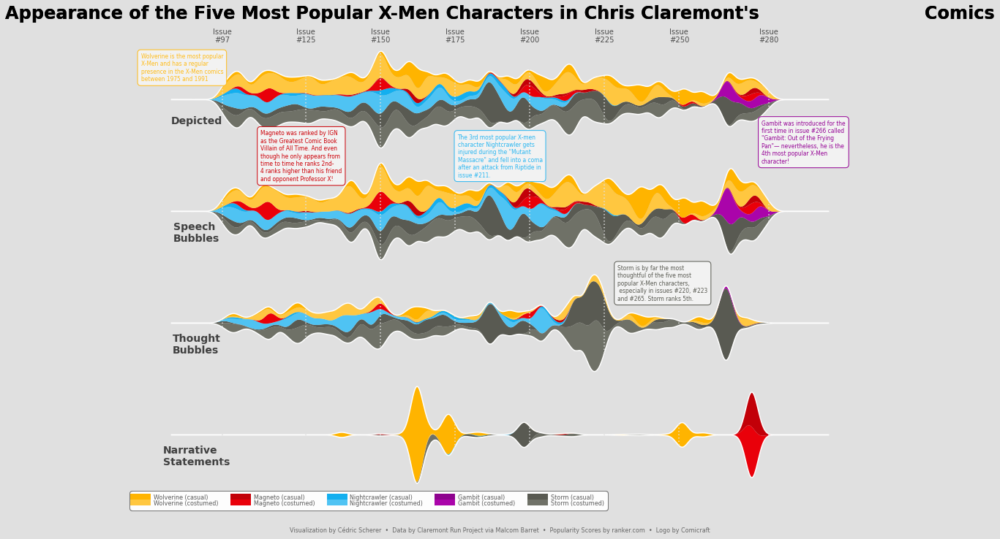

In [ ]:
# Add legend -----------------------------------------------------

# A helper function that creates each handle for the legend
def get_handle(label, color):
    line = Line2D(
        [0], 
        [0], 
        color=color, 
        label=label,
        lw=8
    )
    return line

# Create the labels
names = ["Wolverine", "Magneto", "Nightcrawler", "Gambit", "Storm"]
costumes = ["casual", "costumed"]
labels = [f"{name} ({costume})" for name in names for costume in costumes]

# And create the handles
handles = [get_handle(label, color) for label, color in zip(labels, PALETTE[::-1])]

# Now, add the legend. 
legend = fig.legend(
    handles=handles,
    bbox_to_anchor=[0.5, 0.07], # Located in the mid-bottom of the figure.
    edgecolor=GREY40,
    labelspacing=-0.1,
    loc="center", 
    ncol=5 # The 10 handles are splitted between 5 columns
)

# Change size and color of legend labels
for text in legend.get_texts():
    text.set_fontsize(8)   
    text.set_color(GREY40)

# And finally give a rounded appearence to the frame of the legend
legend.get_frame().set_boxstyle("round", rounding_size=0.4, pad=0.1)    


# Add title ------------------------------------------------------
# Note the space in the text. It is where the image will be located.
fig.text(
    0.5,
    0.95,
    "Appearance of the Five Most Popular X-Men Characters in Chris Claremont's                           Comics",
    fontsize=24,
    fontweight="bold",
    ha="center"
)


# Create annotation box to place image.
# It will be added at (0.815, 0.955) in figure coordinates.
# (0, 0) is bottom-left and (1, 1) is top-right.
# ab = AnnotationBbox(
#     OffsetImage(IMAGE, zoom=0.20), # Add the image with a 20% of its original size.
#     (0.815, 0.955), 
#     xycoords="figure fraction", 
#     box_alignment=(0, 0.5),
#     pad=0, 
#     frameon=False
# )

# Add the annotation box into the figure
# fig.add_artist(ab)


# Add caption ----------------------------------------------------
# And finally, the caption that gives credit to the creator of 
# this amazing viz.
fig.text(
    0.5, 
    0.02, 
    "Visualization by Cédric Scherer  •  Data by Claremont Run Project via Malcom Barret  •  Popularity Scores by ranker.com  •  Logo by Comicraft",
    color=GREY40,
    fontsize=8,
    ha="center"

)

# Note: you can use `fig.savefig("plot.png", dpi=300)` to see this with better quality.
fig